# VO2max Prediction Using Treadmill Maximal Exercise Tests and Machine Learning Techniques

In [1]:
#!pip install tsfel


In [110]:
# Import necessary libraries

import numpy as np  # For numerical computations
import matplotlib.pyplot as plt  # For data visualization (plots)
import pandas as pd  # For handling tabular data (dataframes)
import seaborn as sns  # For enhanced visualizations
from scipy import signal  # For signal processing functions
from collections import Counter  # For counting elements in a collection
from sklearn.utils import indexable, resample  # For data indexing and sampling
from sklearn.utils.validation import _num_samples  # To determine the number of samples in the data
from sklearn.model_selection import (  # For dataset splitting and cross-validation
    ShuffleSplit, StratifiedShuffleSplit, train_test_split, cross_val_score, 
    cross_val_predict, GridSearchCV
)
from sklearn.preprocessing import (  # For data scaling and preprocessing
    StandardScaler, MinMaxScaler, PolynomialFeatures
)
from sklearn.metrics import (  # For regression performance evaluation
    mean_squared_error, mean_absolute_error, r2_score
)
from sklearn.linear_model import (  # For various linear regression models
    LinearRegression, Ridge, RidgeCV, Lasso, LassoCV, MultiTaskLassoCV
)
from sklearn.pipeline import Pipeline  # For building machine learning pipelines
from sklearn.compose import ColumnTransformer  # For handling preprocessing of multiple feature types
from math import ceil, floor  # For mathematical computations (rounding)
from scipy.signal import welch  # For power spectral density estimation (signal processing)
from scipy.stats import (  # For statistical analysis
    linregress, shapiro
)
from sklearn.feature_selection import (  # For feature selection methods
    mutual_info_regression, RFE, SequentialFeatureSelector
)
from scipy.stats import spearmanr  # For calculating Spearman's rank correlation
from sklearn.ensemble import RandomForestRegressor  # For random forest regressor
from sklearn.svm import SVR  # For support vector regression
from xgboost import XGBRegressor  # For XGBoost regressor
from sklearn.model_selection import RandomizedSearchCV, KFold  # For hyperparameter optimization and cross-validation
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, max_error # For metric evaluation


## Loading Dataset

The following code focuses on loading and preprocessing two datasets: subject information and test measurements.

In [2]:
# Loading the subject information dataset
# This dataset contains general information about the participants
subject_data = pd.read_csv('physionet.org/files/treadmill-exercise-cardioresp/1.0.1/subject-info.csv')

# basic information
print("Measurement Data Overview:")
display(subject_data.head()) # first rows
print("Initial Dataset Info:")
print(subject_data.info())
print(subject_data.describe()) # statistics

Measurement Data Overview:


,Age,Weight,Height,Humidity,Temperature,Sex,ID,ID_test
0,10.8,48.8,163.0,39.0,20.7,1,543,543_1
1,11.8,41.0,150.0,41.0,22.3,1,11,11_1
2,12.2,46.0,160.0,37.0,21.5,0,829,829_1
3,13.2,71.0,190.0,49.0,23.8,1,284,284_1
4,13.7,53.8,169.7,40.0,25.3,0,341,341_1


Initial Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 992 entries, 0 to 991
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Age          992 non-null    float64
 1   Weight       992 non-null    float64
 2   Height       992 non-null    float64
 3   Humidity     962 non-null    float64
 4   Temperature  962 non-null    float64
 5   Sex          992 non-null    int64  
 6   ID           992 non-null    int64  
 7   ID_test      992 non-null    object 
dtypes: float64(5), int64(2), object(1)
memory usage: 62.1+ KB
None
              Age      Weight      Height    Humidity  Temperature  \
count  992.000000  992.000000  992.000000  962.000000   962.000000   
mean    28.979133   73.383367  174.913508   48.211435    22.818565   
std     10.076653   12.005361    7.950027    8.560991     2.784066   
min     10.800000   41.000000  150.000000   23.700000    15.000000   
25%     21.100000   66.000000  170.0

In [3]:
# Loading the measurement data, which includes HR, VO2, RR, and other physiological variables
measurement_data = pd.read_csv('physionet.org/files/treadmill-exercise-cardioresp/1.0.1/test_measure.csv')

# basic information
print("Measurement Data Overview:")
display(measurement_data.head()) # first rows
print("Measurement Dataset Info:")
print(measurement_data.info())
print(measurement_data.describe()) # statistics

Measurement Data Overview:


,time,Speed,HR,VO2,VCO2,RR,VE,ID_test,ID
0,0,5.0,63.0,478.0,360.0,27,13.3,2_1,2
1,2,5.0,75.0,401.0,295.0,23,10.3,2_1,2
2,4,5.0,82.0,449.0,319.0,29,12.2,2_1,2
3,7,5.0,87.0,461.0,340.0,28,12.8,2_1,2
4,9,5.0,92.0,574.0,417.0,28,14.6,2_1,2


Measurement Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 575087 entries, 0 to 575086
Data columns (total 9 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   time     575087 non-null  int64  
 1   Speed    575087 non-null  float64
 2   HR       574106 non-null  float64
 3   VO2      570216 non-null  float64
 4   VCO2     570216 non-null  float64
 5   RR       575087 non-null  int64  
 6   VE       575087 non-null  float64
 7   ID_test  575087 non-null  object 
 8   ID       575087 non-null  int64  
dtypes: float64(5), int64(3), object(1)
memory usage: 39.5+ MB
None
                time          Speed             HR            VO2  \
count  575087.000000  575087.000000  574106.000000  570216.000000   
mean      628.126172       9.607958     146.940892    2313.617768   
std       325.588844       4.520384      32.206372     978.103888   
min         0.000000       0.000000       0.000000      -5.000000   
25%       375.000000  

## Data Cleaning and Pre-Processing

The feature selection process is based on the Paper: Heart Rate Variability Based Estimation of Maximal Oxygen
Uptake in Athletes Using Supervised Regression Models.

The code implements a pipeline for cleaning the data, which involves handling missing values, removing outliers, and filtering data based on physiological assumptions to ensure quality. 

In [4]:
# check if there are missing values
print("Missing Values per Column:")
print(measurement_data.isnull().sum())

Missing Values per Column:
time          0
Speed         0
HR          981
VO2        4871
VCO2       4871
RR            0
VE            0
ID_test       0
ID            0
dtype: int64


In [5]:
# Defining a data cleaning pipeline
def pipeline_data_cleaning(data):
    """
    Preprocess the measurement data by performing the following steps:
    - Remove rows with missing target variables (HR, VO2).
    - Handle outliers in RR intervals.
    - Ensure HR and VO2 are in-phase for physiological consistency.
    - Filter out improbable HR differences.
    - Retain only data with sufficient duration (≥ 5 minutes).
    - Split the data into exercise and recovery phases.
    
    Parameters:
        data (pd.DataFrame): The raw measurement dataset.
    
    Returns:
        exercise_data (pd.DataFrame): Data from the exercise phase.
        recovery_data (pd.DataFrame): Data from the recovery phase.
    """
    # Remove rows with missing HR or VO2 values
    measurement_data_cleaned = data.dropna(subset=['HR', 'VO2'])
    print(f'Rows removed due to missing HR or VO2: {len(data) - len(measurement_data_cleaned)}')

    # Remove outliers in RR intervals (retain values between 5 and 50 breaths per minute)
    measurement_data_cleaned['RR'] = np.where((measurement_data_cleaned['RR'] < 5) | 
                                              (measurement_data_cleaned['RR'] > 50), 
                                              np.nan, measurement_data_cleaned['RR'])

    # Interpolate missing RR values linearly
    measurement_data_cleaned['RR'] = measurement_data_cleaned['RR'].interpolate(method='linear')

    # Display remaining missing values after interpolation
    print("Remaining Missing Values after Interpolation:")
    print(measurement_data_cleaned.isnull().sum())

    # Remove data points where HR and VO2 changes are not in phase
    delta_hr = np.diff(measurement_data_cleaned['HR'])
    delta_vo2max = np.diff(measurement_data_cleaned['VO2'])
    
    # Adjust dataset indices before applying the in-phase mask
    measurement_data_cleaned = measurement_data_cleaned.iloc[:-1]  # Drop the last row
    in_phase_mask = (delta_hr * delta_vo2max) > 0
    measurement_data_cleaned = measurement_data_cleaned[in_phase_mask]

    # Filter out rows with consecutive HR differences exceeding 30 bpm
    measurement_data_cleaned['HR_diff'] = measurement_data_cleaned['HR'].diff().abs()
    measurement_data_cleaned = measurement_data_cleaned[measurement_data_cleaned['HR_diff'] <= 30]

    # Retain only rows with at least 5 minutes (300 seconds) of data
    measurement_data_cleaned['time'] = measurement_data_cleaned['time'].astype(float)
    measurement_data_cleaned = measurement_data_cleaned[measurement_data_cleaned['time'] >= 300]

    # Print the size of the dataset after cleaning
    print(f'Dataset size after cleaning: {measurement_data_cleaned.shape}')

    # Split the data into exercise and recovery phases
    exercise_data = measurement_data_cleaned[measurement_data_cleaned['Speed'] >= 5]  # Exercise phase
    recovery_data = measurement_data_cleaned[measurement_data_cleaned['Speed'] < 5]  # Recovery phase

    return exercise_data, recovery_data

In [6]:
# Apply the cleaning pipeline to the measurement data
exercise_data, recovery_data = pipeline_data_cleaning(measurement_data)

# Print the sizes of the exercise and recovery datasets
print(f'Exercise data size: {exercise_data.shape}')
print(f'Recovery data size: {recovery_data.shape}')

Rows removed due to missing HR or VO2: 5840
Remaining Missing Values after Interpolation:
time       0
Speed      0
HR         0
VO2        0
VCO2       0
RR         0
VE         0
ID_test    0
ID         0
dtype: int64
Dataset size after cleaning: (100039, 10)
Exercise data size: (85872, 10)
Recovery data size: (14167, 10)


/var/folders/bd/3yf697f17xx34gzbkjr3wz9r0000gn/T/ipykernel_37568/1900367754.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  measurement_data_cleaned['RR'] = np.where((measurement_data_cleaned['RR'] < 5) |
/var/folders/bd/3yf697f17xx34gzbkjr3wz9r0000gn/T/ipykernel_37568/1900367754.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  measurement_data_cleaned['RR'] = measurement_data_cleaned['RR'].interpolate(method='linear')


In [7]:
# Remove all data from test IDs with missing HR or VO2
#difference = pd.merge(merged_data, measurement_data_cleaned, how='outer', indicator=True).query('_merge == "left_only"').drop('_merge', axis=1)
#exclude_ids = difference['ID_test'].unique()
#measurement_data_cleaned = measurement_data_cleaned[~measurement_data_cleaned['ID_test'].isin(exclude_ids)]

## Feature Extraction

This section includes detailed descriptions of the code snippets used to process heart rate (HR) and heart rate variability (HRV) data, extract features, normalize them, and perform statistical tests.

#### 1. Poincaré Plot:

This function visualizes the relationship between consecutive RR intervals in a time series using a Poincaré plot. It calculates and displays SD1 (short-term variability) and SD2 (long-term variability).

In [8]:
def poincare_plot(data):
    """
    Generate a Poincaré plot for RR intervals and calculate SD1 and SD2.

    Parameters:
    data (DataFrame): A DataFrame containing an 'RR' column with RR intervals.

    Returns:
    None: Displays the plot and prints SD1, SD2 values.
    """    
    # Sample RR intervals
    rr_intervals = data['RR'].values
    # Calculate consecutive differences for Poincaré plot
    rr_diff1 = rr_intervals[:-1]  # RR interval at time t
    rr_diff2 = rr_intervals[1:]  # RR interval at time t+1

    # Calculate mean of RR intervals
    rr_mean = np.mean(rr_intervals)

    # Calculate SD1 and SD2
    sd1 = np.sqrt(0.5) * np.std(rr_diff2 - rr_diff1)
    sd2 = np.sqrt(2 * np.std(rr_diff1)**2 - sd1**2)

    # Line of identity
    identity_line = np.linspace(min(rr_intervals), max(rr_intervals), 100)

    # Create Poincaré plot
    plt.figure(figsize=(8, 8))
    plt.scatter(rr_diff1, rr_diff2, alpha=0.6, label="RR intervals")
    plt.plot(identity_line, identity_line, color="red", linestyle="--", label="Line of Identity")
    plt.xlim(min(rr_intervals), max(rr_intervals)+20)
    plt.ylim(min(rr_intervals), max(rr_intervals)+20)

    # SD1 and SD2 ellipse visualization
    mean_rr = [np.mean(rr_diff1), np.mean(rr_diff2)]
    ellipse_angle = 45
    ellipse_sd1 = plt.Circle(mean_rr, sd1, color="blue", fill=False, label="SD1")
    ellipse_sd2 = plt.Circle(mean_rr, sd2, color="green", fill=False, label="SD2")
    plt.gca().add_patch(ellipse_sd1)
    plt.gca().add_patch(ellipse_sd2)

    # Formatting
    plt.title("Poincaré Plot")
    plt.xlabel("RR Interval (n)")
    plt.ylabel("RR Interval (n+1)")
    plt.legend()
    plt.grid(alpha=0.4)
    plt.axis("equal")
    plt.show()

    # Print SD1 and SD2
    print(f"SD1: {sd1:.2f} ms")
    print(f"SD2: {sd2:.2f} ms")



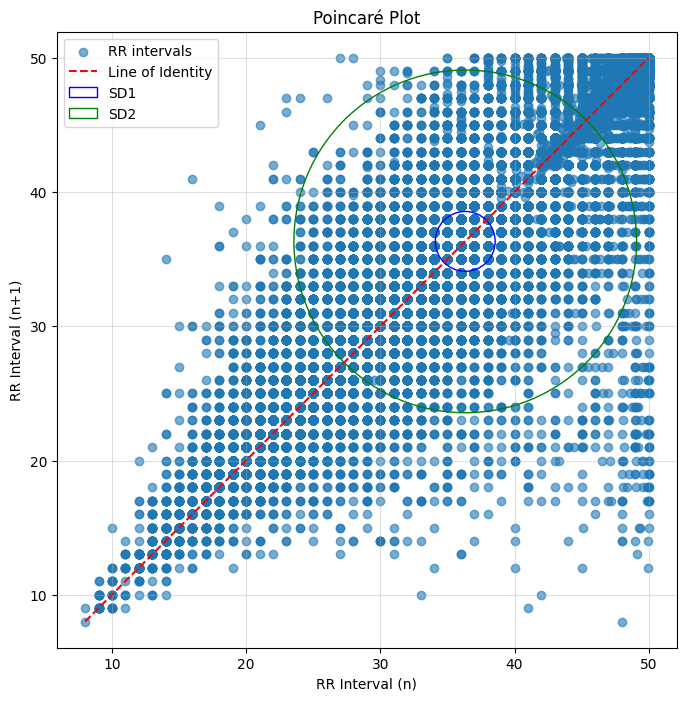

SD1: 2.23 ms
SD2: 12.77 ms


In [9]:
# apply poincare to exercise data

poincare_plot(exercise_data)

Exercise Plot:

Larger Variability (SD1 and SD2):
The points are more widely spread around the line of identity, indicating greater short-term variability (SD1) and long-term variability (SD2).
This is typical during physical activity, as the cardiovascular system adapts to the increased demands of exercise.
The activity of the sympathetic nervous system increases, accelerating the heart rate and increasing the variability in RR intervals.

Higher SD1:
Short-term fluctuations dominate (e.g., from breathing or movement), reflecting the heart's dynamic response to exercise.

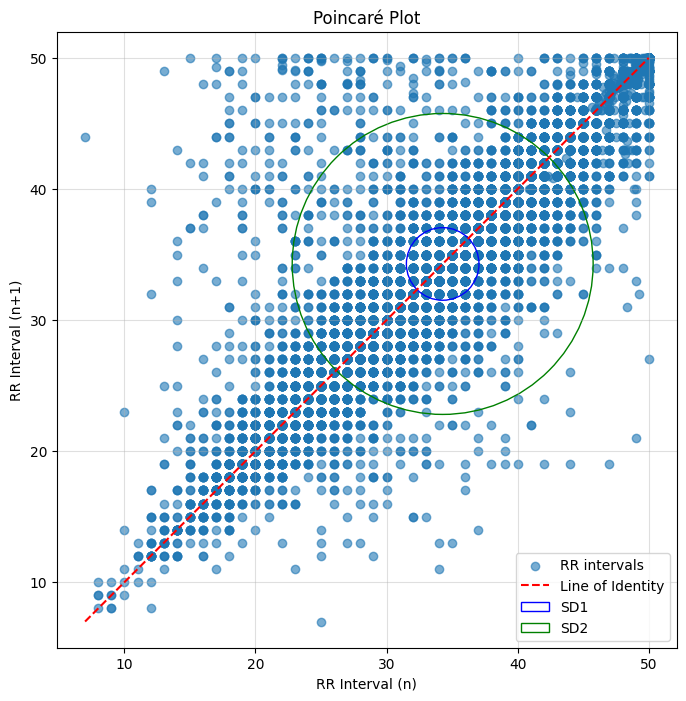

SD1: 2.77 ms
SD2: 11.48 ms


In [10]:
# apply poincare to recovery data

poincare_plot(recovery_data)

Recovery Plot:

Tighter Cluster of Points (Reduced SD1 and SD2):
During recovery, both short-term (SD1) and long-term variability (SD2) decrease as the cardiovascular system transitions back to a resting state.
This reflects activation of the parasympathetic nervous system, which works to slow the heart rate and stabilize RR intervals.

Lower SD1:
Short-term fluctuations diminish as the body's immediate demands are reduced, and the heart rate stabilizes.

Lower SD2:
Long-term variability also decreases, as the heart no longer needs to adjust rapidly to external demands.

#### 2. Calculate Slope for a Feature
This utility calculates the slope of a given feature over time using linear regression.

In [11]:

# Function to calculate slopes over time for a feature

def calculate_slopes(df, feature):
    """
    Calculate the slope of a feature over time using linear regression.

    Parameters:
    df (pd.DataFrame): DataFrame containing the 'time' and feature columns.
    feature (str): The feature column for which the slope is calculated.

    Returns:
    float: Slope of the feature over time. NaN if the input DataFrame is empty.
    """
    if len(df) == 0:  # Handle empty DataFrame
        return np.nan
    else:
        # Use linear regression to calculate the slope
        slope = linregress(df['time'], df[feature]).slope
        return slope
    



#### 3. Compute HR and HRV Features
This function extracts time-domain, frequency-domain, and nonlinear features from a data segment.

In [12]:
 # Function to compute HR & HRV features for a given data segment

def compute_hr_features(segment: pd.DataFrame) -> dict:
    """
    Calculate heart rate variability (HRV) features and additional metrics from a data segment.

    Parameters:
    segment (pd.DataFrame): A DataFrame containing the segment data.

    Returns:
    dict: A dictionary of computed features.
    """

    hr = segment['HR'].values
    time = segment['time'].values
    rr_intervals = segment['RR'].values 

    # Time-Domain-Features
    rmssd = np.sqrt(np.mean(np.diff(rr_intervals) ** 2))  # RMSSD: Root Mean Square of Successive Differences
    pnn20 = np.mean(np.abs(np.diff(rr_intervals)) > 0.5) * 100  # % of differences > 20 ms
    pnn50 = np.mean(np.abs(np.diff(rr_intervals)) > 1.25) * 100  # % of differences > 50 ms
    nni20 = np.sum(np.abs(np.diff(rr_intervals)) > 0.5)  # Count of differences > 20 ms
    nni50 = np.sum(np.abs(np.diff(rr_intervals)) > 1.25)  # Count of differences > 50 ms
    nni_range = np.max(rr_intervals) - np.min(rr_intervals)  # Range of RR intervals
    
    # Frequency-Domain-Features
    fs = 4  # Sampling frequency in Hz (adjust based on your data)
    f, pxx = welch(rr_intervals, fs, nperseg=len(rr_intervals))  # Welch's power spectral density
    vlf_power = np.trapz(pxx[(f >= 0.003) & (f < 0.04)], f[(f >= 0.003) & (f < 0.04)])  # VLF band
    lf_power = np.trapz(pxx[(f >= 0.04) & (f < 0.15)], f[(f >= 0.04) & (f < 0.15)])  # LF band
    hf_power = np.trapz(pxx[(f >= 0.15) & (f < 0.4)], f[(f >= 0.15) & (f < 0.4)])  # HF band
    lf_nu_power = lf_power / (vlf_power + lf_power + hf_power)  # LF normalized power

    # Nonlinear Features (Poincare Plot, DFA)
    sd1 = np.sqrt(0.5) * np.std(rr_intervals[1:] - rr_intervals[:-1])  # Short-term variability
    sd2 = np.sqrt(2 * np.std(rr_intervals[:-1]) ** 2 - sd1 ** 2)  # Long-term variability
    dfa_a1 = np.std(rr_intervals[:len(rr_intervals)//2]) / np.std(rr_intervals)  # Placeholder for DFA Alpha-1
    
    # Slope-Based Features
    slope_nni = np.polyfit(time, rr_intervals, 1)[0]  # Slope of NN intervals over time

    # Additional Features
    max_hr = max(hr)  # Max HR in the segment
    min_hr = min(hr)  # Min HR in the segment
    vo2_max = segment['VO2'].max()  # Max VO2 in the segment
    
    # Slopes for Poincare Plot Features
    # slope_sd1 = np.polyfit(time, [sd1] * len(time), 1)[0]
    # slope_sd2 = np.polyfit(time, [sd2] * len(time), 1)[0]

    # Time-based features
    max_speed = segment['Speed'].max()
    slope_sp25 = calculate_slopes(segment[segment['Speed'] <= max_speed * 0.25], 'HR')
    slope_sp50 = calculate_slopes(segment[(segment['Speed'] <= max_speed * 0.5) & (segment['Speed'] > max_speed * 0.25)], 'HR')
    slope_sp75 = calculate_slopes(segment[(segment['Speed'] <= max_speed * 0.75) & (segment['Speed'] > max_speed * 0.5)], 'HR')
    slope_sp100 = calculate_slopes(segment[(segment['Speed'] > max_speed * 0.75)], 'HR')
    rt25 = segment.loc[segment['time'] <= segment['time'].max() * 0.25, 'HR'].corr(segment['time'])
    rt50 = segment.loc[(segment['time'] >= segment['time'].max() * 0.25) & (segment['time'] < segment['time'].max() * 0.5), 'HR'].corr(segment['time'])
    rt75 = segment.loc[(segment['time'] >= segment['time'].max() * 0.5) & (segment['time'] < segment['time'].max() * 0.75), 'HR'].corr(segment['time'])
    rsp75 = segment.loc[segment['Speed'] <= max_speed * 0.75, 'HR'].corr(segment['Speed'])
    rsp25 = segment.loc[segment['Speed'] <= max_speed * 0.25, 'HR'].corr(segment['Speed'])
    time_sp25 = segment[segment['Speed'] >= max_speed * 0.25]['time'].min()
    time_hr25 = segment[segment['HR'] >= max_hr * 0.25]['time'].min()
    time_hr50 = segment[segment['HR'] >= max_hr * 0.5]['time'].min()
    time_hr75 = segment[segment['HR'] >= max_hr * 0.75]['time'].min()
    duration_hr60 = len(segment[(segment['HR'] >= max_hr * 0.5) & (segment['HR'] < max_hr * 0.6)]) * (segment['time'].diff().mean())
    duration_hr70 = len(segment[(segment['HR'] >= max_hr * 0.6) & (segment['HR'] < max_hr * 0.7)]) * (segment['time'].diff().mean())
    duration_hr80 = len(segment[(segment['HR'] >= max_hr * 0.7) & (segment['HR'] < max_hr * 0.8)]) * (segment['time'].diff().mean())
    duration_hr90 = len(segment[(segment['HR'] >= max_hr * 0.8) & (segment['HR'] < max_hr * 0.9)]) * (segment['time'].diff().mean())
    duration_hr100 = len(segment[(segment['HR'] >= max_hr * 0.9) & (segment['HR'] <= max_hr)]) * (segment['time'].diff().mean())

    
    # Feature Dictionary
    Features = {'RMSSD': rmssd,
        'PNN20': pnn20,
        'PNN50': pnn50,
        'NNI20': nni20,
        'NNI50': nni50,
        'NNI_Range': nni_range,
        'VLF_Power': vlf_power,
        'LF_Power': lf_power,
        'HF_Power': hf_power,
        'LF_Nu_Power': lf_nu_power,
        'SD1': sd1,
        'SD2': sd2,
        'DFA_A1': dfa_a1,
        'Slope_NNI': slope_nni,
        'Slope_Speed25': slope_sp25,
        'Slope_Speed50': slope_sp50,
        'Slope_Speed75': slope_sp75,
        'Slope_Speed100': slope_sp100,
        'RT25': rt25,
        'RT50': rt50,
        'RT75': rt75,
        'RSP75': rsp75,
        'RSP25': rsp25,
        'Time_SP25': time_sp25,
        'Time_HR25': time_hr25,
        'Time_HR50': time_hr50,
        'Time_HR75': time_hr75,
        'DurationHR60': duration_hr60,
        'DurationHR70': duration_hr70,
        'DurationHR80': duration_hr80,
        'DurationHR90': duration_hr90,
        'DurationHR100': duration_hr100,
        'VO2max': segment['VO2'].max(),
    }
    
    return Features

In [13]:
# Function to calculate features for each segment
def calculate_features_per_segment(df, test_column):
    """
    Calculate features for each segment grouped by the specified column.

    Parameters:
    df (pd.DataFrame): The input data.
    test_column (str): The column to group by (e.g., test IDs).

    Returns:
    pd.DataFrame: DataFrame of computed features for each segment.
    """
    all_features = []  # List to store features for all segments

    for test_id, df_segment in df.groupby(test_column):  # Group by the test column
        features = compute_hr_features(df_segment)  # Compute features for the segment
        features[test_column] = test_id  # Add the test ID to the features
        all_features.append(features)  # Append the features

    return pd.DataFrame(all_features)  # Return all features as a DataFrame

#### 4. Feature Normalization
Normalize numerical features to have a mean of 0 and a standard deviation of 1.

In [15]:
# Function to normalize numerical features in a DataFrame
def normalize_features(dataframe):
    """
    Normalize numerical features in a DataFrame using StandardScaler.

    Parameters:
    dataframe (pd.DataFrame): The input DataFrame.

    Returns:
    pd.DataFrame: A DataFrame with normalized numerical features.
    """
    # Identify numerical columns (excluding target variables or IDs)
    numerical_features = dataframe.select_dtypes(include=['float64', 'int64']).columns

    # Initialize StandardScaler (scales data to mean=0, std=1)
    scaler = StandardScaler()

    # Fit and transform numerical features
    normalized_data = scaler.fit_transform(dataframe[numerical_features])

    # Convert normalized data back to a DataFrame for readability
    normalized_df = pd.DataFrame(normalized_data, columns=numerical_features)

    # Copy the original DataFrame and replace numerical columns with normalized values
    normalized_features = dataframe.copy()
    normalized_features[numerical_features] = normalized_df

    return normalized_features



In [16]:
# pipeline for feature extraction and normalization

def pipeline_feature_extraction(data, subject_data):
    """
    Extract and normalize features from the data pipeline.

    Parameters:
    data (DataFrame): Input data.
    subject_data (DataFrame): Metadata.

    Returns:
    DataFrame: Normalized feature data.
    """
    additional_features = calculate_features_per_segment(data, 'ID_test')#ID_test_y')
    
    #new_features['ID_test'] = new_features['ID_test_y']
    merged_data = pd.merge(subject_data, additional_features, on='ID_test', how='inner')
    
    # delete ID columns as they are not needed for the model
    merged_data = merged_data.drop(columns=['ID_test', 'ID'])
    
    normalized_features = normalize_features(merged_data)
    
    return normalized_features

normalized_features_exercise = pipeline_feature_extraction(exercise_data, subject_data)
normalized_features_recovery = pipeline_feature_extraction(recovery_data, subject_data)

/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multip

In [17]:
# shapes of dataframes
print(f'Exercise data size: {normalized_features_exercise.shape}')
print(f'Recovery data size: {normalized_features_recovery.shape}')

Exercise data size: (981, 39)
Recovery data size: (317, 39)


#### 5. Shapiro-Wilk Test
This function tests the normality of each feature using the Shapiro-Wilk test.

In [18]:
# Function to perform Shapiro-Wilk test for normality on each numerical feature
def shapiro_wilk_test(dataframe):
    """
    Perform the Shapiro-Wilk test for normality on all numerical features in the DataFrame.

    Parameters:
    dataframe (pd.DataFrame): The input DataFrame.

    Returns:
    tuple: A DataFrame with Shapiro-Wilk test results (statistic and p-value) 
           and another DataFrame identifying non-normally distributed features.
    """
    # Identify numerical columns (excluding target variables or IDs)
    numerical_features = dataframe.select_dtypes(include=['float64', 'int64']).columns

    # Dictionary to store Shapiro-Wilk test results
    shapiro_results = {}

    for column in numerical_features:
        # Perform Shapiro-Wilk test for the column
        stat, p = shapiro(dataframe[column])
        shapiro_results[column] = {'Statistic': stat, 'p-value': p}

    # Convert results dictionary to a DataFrame
    shapiro_results_df = pd.DataFrame(shapiro_results).T
    shapiro_results_df.columns = ['Shapiro Statistic', 'p-value']

    # Identify features that are not normally distributed (p-value <= 0.05)
    non_normal_features = shapiro_results_df[shapiro_results_df['p-value'] <= 0.05]

    return shapiro_results_df, non_normal_features



In [19]:
# Run Shapiro-Wilk test and display results for exercise and recovery data
print("Shapiro-Wilk Test Results for Exercise Data:")
shapiro_results_exercise, non_normal_features_exercise = shapiro_wilk_test(normalized_features_exercise)
print(shapiro_results_exercise)  # Uncomment to display the full results for all features

print("Shapiro-Wilk Test Results for Recovery Data:")
shapiro_results_recovery, non_normal_features_recovery = shapiro_wilk_test(normalized_features_recovery)
print(shapiro_results_recovery)  # Uncomment to display the full results for all features

# Display features that are not normally distributed
print("\nExercise Features that are NOT Normally Distributed:")
print(non_normal_features_exercise)

print("\nRecovery Features that are NOT Normally Distributed:")
print(non_normal_features_recovery)

Shapiro-Wilk Test Results for Exercise Data:
                Shapiro Statistic       p-value
Age                      0.960223  1.092042e-15
Weight                   0.981725  9.514245e-10
Height                   0.996589  3.198692e-02
Humidity                      NaN           NaN
Temperature                   NaN           NaN
Sex                      0.423068  2.996888e-48
RMSSD                    0.964771  1.174175e-14
PNN20                    0.962115  2.863421e-15
PNN50                    0.997541  1.486450e-01
NNI20                    0.994368  9.904565e-04
NNI50                    0.986606  8.160714e-08
NNI_Range                0.991673  2.444314e-05
VLF_Power                0.020442  6.173173e-57
LF_Power                 0.799519  3.997152e-33
HF_Power                 0.743751  2.254826e-36
LF_Nu_Power                   NaN           NaN
SD1                      0.965043  1.362248e-14
SD2                      0.992437  6.603047e-05
DFA_A1                   0.961254  1.839111

/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Key Insights from Exercise Data:

Normally Distributed Variables (p-value ≥ 0.05):
PNN50: Indicates some of the short-term HRV features could be normally distributed.
VO2max: Indicates a normal distribution for the maximum oxygen uptake data.

Non-Normally Distributed Variables (p-value < 0.05):
Many HRV-related features like RMSSD, SD1, SD2, PNN20, LF Power, HF Power, and slope metrics do not follow a normal distribution during exercise. This reflects the physiological variability due to heightened autonomic control during exercise.
Demographic variables such as Age, Weight, Sex are also non-normal, likely due to sample-specific characteristics.

Strongly Non-Normal Variables (p-value near 0):
Metrics like VLF Power (p ≈ 0), Time_HR25, and other time-based heart rate variables show extreme deviation from normality. These may require transformations (e.g., logarithmic) or non-parametric analysis.

Key Insights from Recovery Data:

Normally Distributed Variables (p-value ≥ 0.05):
Height, Time_HR75, and NNI_Range show evidence of being normally distributed.

Non-Normally Distributed Variables (p-value < 0.05):
Key HRV features such as RMSSD, PNN20, NNI20, SD1, and HF Power are not normally distributed, even during recovery. This suggests residual variability in autonomic regulation post-exercise.
Most time-based variables and VO2max also deviate from normality.

Strongly Non-Normal Variables:
Features like LF Power, HF Power, and Time_SP25 show extreme deviations from normality during recovery as well, reflecting irregular recovery dynamics.

A lot features are not normally distributed which is we choose Feature Selection Methods that do not assume the data to be normally distributed (Mutual Information, Spearson Coefficient).

## Correlation-based, Mutual-information-based and greedy forward and backward Feature Selection

This section is responsible for identifying highly correlated features in the dataset, selecting the most important features and deleting redundant ones.

In [20]:
# Identify and visualize highly correlated features
def correlated_features(dataframe, threshold=0.7, plot_result=True):
    """
    Identifies pairs of highly correlated features based on the given threshold and visualizes the correlation matrix.

    Parameters:
        dataframe (pd.DataFrame): The input dataframe.
        threshold (float): The correlation coefficient threshold to identify highly correlated features. Default is 0.7.

    Returns:
        pd.DataFrame: A dataframe containing pairs of highly correlated features.
    """
    # Calculate the correlation matrix
    correlation_matrix = dataframe.corr()
    
    if plot_result == True:
        # Create a mask for the upper triangle
        mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
        plt.figure(figsize=(12, 8))
        sns.heatmap(correlation_matrix, mask=mask, annot=False, cmap='seismic', center=0)
        plt.title('Feature Correlation Matrix')
        plt.show()

    # Find highly correlated feature pairs (off-diagonal elements > threshold)
    highly_correlated_pairs = correlation_matrix.where(
        (correlation_matrix.abs() > threshold) & (np.eye(correlation_matrix.shape[0]) == 0)
    ).stack()
    highly_correlated_pairs = pd.DataFrame(highly_correlated_pairs).T

    if not highly_correlated_pairs.empty:
        print("\nHighly Correlated Feature Pairs:")
        print(highly_correlated_pairs)

    return highly_correlated_pairs


In [21]:
# Remove highly correlated features
def remove_correlated_features(dataframe, highly_correlated_pairs):
    """
    Removes one feature from each pair of highly correlated features.

    Parameters:
        dataframe (pd.DataFrame): The input dataframe.
        highly_correlated_pairs (pd.DataFrame): Dataframe containing pairs of highly correlated features.

    Returns:
        pd.DataFrame: The dataframe with highly correlated features removed.
    """
    # Flatten pairs to count occurrences of each feature
    flat_features = [item for pair in highly_correlated_pairs for item in pair]
    feature_counts = Counter(flat_features)

    # Initialize sets to keep track of features to keep and drop
    features_to_keep = set()
    features_to_drop = set()

    # Process each pair to decide which feature to drop
    for feature1, feature2 in highly_correlated_pairs:
        # If neither feature is already marked for keeping, drop the less frequent one
        if feature1 not in features_to_keep and feature2 not in features_to_keep:
            if feature_counts[feature1] >= feature_counts[feature2]:
                features_to_keep.add(feature1)
                features_to_drop.add(feature2)
            else:
                features_to_keep.add(feature2)
                features_to_drop.add(feature1)
        # If one is already kept, drop the other
        elif feature1 in features_to_keep:
            features_to_drop.add(feature2)
        elif feature2 in features_to_keep:
            features_to_drop.add(feature1)

    # Get the final list of features to keep
    final_features = set(flat_features) - features_to_drop
    print(f"Features to keep: {sorted(final_features)}")
    print(f"Features to drop: {sorted(features_to_drop)}")
    reduced_data = dataframe.drop(columns=features_to_drop)
    return reduced_data

In [22]:
# Remove features with more than 50% missing values
def remove_nan_features(dataframe, threshold=0.5):
    """
    Removes features with a high percentage of missing values.

    Parameters:
        dataframe (pd.DataFrame): The input dataframe.
        threshold (float): The threshold for the fraction of NaN values. Features with NaN percentage > threshold will be removed.

    Returns:
        pd.DataFrame: The dataframe with features having high NaN percentages removed.
    """
    nan_counts = dataframe.isnull().mean()
    features_to_remove = nan_counts[nan_counts > threshold].index
    print(f"Features to remove with more than {threshold * 100}% NaN values: {features_to_remove}")
    reduced_data = dataframe.drop(columns=features_to_remove)
    return reduced_data

#### Mutual Information
This function selects features based on their Mutual Information (MI) scores, which quantify the dependence between features and the target variable. Features with an MI score greater than the threshold are selected for the final model.

In [23]:
# Feature Selection using Mutual Information

def mutual_information_FS(dataframe, target_column, threshold=0.0):
    """
    Selects features based on their Mutual Information scores with the target variable.

    Parameters:
        dataframe (pd.DataFrame): The input dataframe containing features and the target column.
        target_column (str): The name of the target column in the dataframe.
        threshold (float): Minimum Mutual Information score for a feature to be selected. Default is 0.0.

    Returns:
        pd.DataFrame: A dataframe containing Mutual Information scores for all features.
        pd.DataFrame: A dataframe containing only the selected features.
    """
    # Separate features and target
    X = dataframe.drop(columns=[target_column])
    y = dataframe[target_column]
    
    # Ignore features with NaN values
    X = X.dropna(axis=1)

    # Calculate Mutual Information scores
    mi_scores = mutual_info_regression(X, y)

    # Create a DataFrame for feature scores
    feature_scores = pd.DataFrame({
        'Feature': X.columns,
        'Mutual_Information': mi_scores
    }).sort_values(by='Mutual_Information', ascending=False).reset_index(drop=True)

    # Select features based on threshold
    selected_features = feature_scores[feature_scores['Mutual_Information'] > threshold]['Feature']
    print(f"Selected Features (MI > {threshold}): {selected_features.to_list()}")

    # Create a new dataframe with selected features and the target
    selected_dataframe = dataframe[selected_features.to_list() + [target_column]]

    return feature_scores, selected_dataframe

#### Spearman Correlation
Spearman correlation measures the monotonic relationship between two variables. This function removes features that have a low Spearman correlation with the target variable, based on the specified threshold.

In [24]:
# Feature Selection with Spearman Coefficient

def clean_dataframe_by_spearman(dataframe, target_column, threshold=0.1):
    """
    Cleans a dataframe by removing features with Spearman correlation below a given threshold.

    Parameters:
        dataframe (pd.DataFrame): The input dataframe.
        target_column (str): The name of the target column.
        threshold (float): The minimum absolute Spearman correlation for a feature to be retained.

    Returns:
        pd.DataFrame: A cleaned dataframe with only features strongly correlated with the target.
        pd.DataFrame: A summary of Spearman correlation coefficients for all features.
    """
    # Initialize a dictionary to store Spearman correlation coefficients
    spearman_results = {}

    # Iterate over all columns except the target column
    for column in dataframe.columns:
        if column != target_column:
            # Compute Spearman correlation and p-value
            correlation, _ = spearmanr(dataframe[column], dataframe[target_column])
            spearman_results[column] = correlation

    # Convert results to a DataFrame for analysis
    spearman_df = pd.DataFrame({
        'Feature': spearman_results.keys(),
        'Spearman_Coefficient': spearman_results.values()
    })

    # Filter features based on the threshold
    selected_features = spearman_df[
        spearman_df['Spearman_Coefficient'].abs() >= threshold
    ]['Feature']

    # Retain only the selected features and the target column
    cleaned_dataframe = dataframe[selected_features.to_list() + [target_column]]

    return cleaned_dataframe, spearman_df.sort_values(by='Spearman_Coefficient', ascending=False).reset_index(drop=True)

In [25]:
# Feature Selection pipeline

def feature_selection_pipeline(dataframe, target_column='VO2max', corr_threshold = 0.9, nan_threshold=0.5, mi_threshold=0.0, spearman_threshold=0.1, correlation_fs = True, nan_fs = True, mi_fs = True, spearman_fs = True):
    """
    A pipeline that combines multiple feature selection methods:
    - Remove highly correlated features.
    - Remove features with more than `nan_threshold` missing values.
    - Apply Mutual Information-based feature selection.
    - Apply Spearman correlation-based feature selection.
    
    Parameters:
        dataframe (pd.DataFrame): The input dataframe containing features and the target column.
        target_column (str): The name of the target column in the dataframe.
        corr_threshold (float): Threshold for removing highly correlated features.
        nan_threshold (float): Fraction of missing values above which a feature is removed.
        mi_threshold (float): Minimum Mutual Information score for a feature to be selected.
        spearman_threshold (float): Minimum absolute Spearman correlation for a feature to be retained.
    
    Returns:
        pd.DataFrame: A dataframe with selected features after all steps.
        pd.DataFrame: A summary of feature selection results (Mutual Information and Spearman).
    """
    if nan_fs == True:
        # # Option 2: Remove features with more than 50% missing values
        # Remove features with more than `nan_threshold` missing values
        dataframe = remove_nan_features(dataframe, nan_threshold)
        
    if correlation_fs == True:
        # # Option 1: Remove highly correlated features
        # Identify highly correlated features for exercise and recovery datasets
        highly_correlated_pairs_exercise = correlated_features(dataframe, threshold = corr_threshold, plot_result = True)
        dataframe = remove_correlated_features(dataframe, highly_correlated_pairs_exercise)
        
    if mi_fs == True:
        # # Option 3: Remove features with more than 50% missing values
        # Apply Mutual Information feature selection
        mi_scores, dataframe = mutual_information_FS(dataframe, target_column, mi_threshold)
        print(mi_scores)
    
    if spearman_fs == True:
        # # Option 4: Apply Spearman correlation
        # Apply Spearman correlation-based feature selection
        dataframe, spearman_df = clean_dataframe_by_spearman(dataframe, target_column, spearman_threshold)
        print(spearman_df)
    
    
    return dataframe
    

#### Pearson or Spearman?
Pearson Correlation:
Measures linear relationships between variables.
Works well if the data is normally distributed and the relationships are approximately linear.
Less effective if there are outliers or non-linear dependencies.

Spearman Correlation:
Measures monotonic relationships (whether linear or not) between variables.
Based on rank, so it is robust to outliers and works well with non-linear dependencies.
More versatile if the data distribution is unknown or if you suspect non-linear relationships.

So here it makes more sense to use Spearman Correlation.

In [26]:
# feature selection for exercise data

final_data_exercise = feature_selection_pipeline(
    normalized_features_exercise, target_column='VO2max', 
    corr_threshold=0.7, 
    nan_threshold=0.5, 
    mi_threshold=0.01, 
    spearman_threshold=0.1,
    nan_fs = True, correlation_fs = False, mi_fs = True, spearman_fs = True
)
final_data_exercise.columns

Features to remove with more than 50.0% NaN values: Index(['Slope_Speed25', 'RT25', 'RSP25'], dtype='object')
Selected Features (MI > 0.01): ['Height', 'Sex', 'Weight', 'Time_HR75', 'NNI20', 'SD2', 'DurationHR70', 'DurationHR60', 'DurationHR80', 'PNN50', 'NNI_Range', 'NNI50', 'Slope_Speed100', 'DurationHR100', 'Time_HR25', 'Age', 'Slope_NNI', 'LF_Power', 'Time_HR50', 'Time_SP25', 'HF_Power']
           Feature  Mutual_Information
0           Height            0.211052
1              Sex            0.208818
2           Weight            0.175783
3        Time_HR75            0.101198
4            NNI20            0.076308
5              SD2            0.073092
6     DurationHR70            0.059863
7     DurationHR60            0.054328
8     DurationHR80            0.041666
9            PNN50            0.040022
10       NNI_Range            0.036665
11           NNI50            0.030450
12  Slope_Speed100            0.028487
13   DurationHR100            0.024748
14       Time_HR25  

Index(['Height', 'Sex', 'Weight', 'Time_HR75', 'NNI20', 'SD2', 'DurationHR70',
       'DurationHR60', 'DurationHR80', 'NNI_Range', 'NNI50', 'Slope_Speed100',
       'DurationHR100', 'Slope_NNI', 'VO2max'],
      dtype='object')

At first, RT25, SlopeSpeed25 and RSP25 are filtered out because over 50% of their values are NaN. To avoid multicollinearity, some features are dropped that are highly correlated. NNI50 is dropped because of their high correlation with NNI20. RMSSD and PNN20 show a high correlation with PNN50. TimeHR25 and TimeHR50 are highly correlated with TimeSP25 and therefore dropped. And lastly, SD1 and SD2 are correlated to NNI_range and therefore dropped.

With Mutual Information Calculations the columns ['Height', 'Sex', 'Weight', 'Time_HR75', 'NNI20', 'DurationHR70', 'DurationHR60', 'DurationHR80', 'PNN50', 'NNI_Range', 'Slope_Speed100', 'DurationHR100', 'Age', 'Time_SP25', 'LF_Power', 'Slope_NNI'] were selected as they are correlated to the target column. 
['HF_Power', 'RSP75', 'Temperature', 'DurationHR90', 'Slope_Speed75', 'RT75', 'Slope_Speed50', 'Humidity', 'DFA_A1', 'RT50', 'VLF_Power', 'LF_Nu_Power'] were dropped.

In [27]:
# feature selection for recovery data

final_data_recovery = feature_selection_pipeline(
    normalized_features_recovery, target_column='VO2max', 
    corr_threshold=0.7, 
    nan_threshold=0.5, 
    mi_threshold=0.01, 
    spearman_threshold=0.1,
    correlation_fs = False, nan_fs = True, mi_fs = True, spearman_fs = True
)
final_data_recovery.columns

Features to remove with more than 50.0% NaN values: Index(['Slope_Speed25', 'Slope_Speed50', 'Slope_Speed75', 'RT25', 'RT50',
       'RT75', 'RSP75', 'RSP25'],
      dtype='object')
Selected Features (MI > 0.01): ['Weight', 'Sex', 'NNI20', 'Height', 'DurationHR90', 'HF_Power', 'NNI_Range', 'DurationHR80', 'LF_Power', 'DurationHR100', 'DFA_A1', 'DurationHR70', 'RMSSD']
          Feature  Mutual_Information
0          Weight            0.235761
1             Sex            0.183666
2           NNI20            0.132024
3          Height            0.119622
4    DurationHR90            0.098027
5        HF_Power            0.068487
6       NNI_Range            0.063670
7    DurationHR80            0.062745
8        LF_Power            0.043602
9   DurationHR100            0.040705
10         DFA_A1            0.039735
11   DurationHR70            0.032907
12          RMSSD            0.022602
13            Age            0.009994
14            SD1            0.008677
15      VLF_Power    

Index(['Weight', 'Sex', 'NNI20', 'Height', 'HF_Power', 'NNI_Range',
       'DurationHR80', 'LF_Power', 'DurationHR70', 'VO2max'],
      dtype='object')

For the recovery data, the same procedure applies and we are left with the columns ['Weight', 'Sex', 'Height', 'HF_Power', 'NNI_Range', 'DFA_A1','DurationHR70', 'RMSSD', 'Age', 'VO2max'].

The following code performs feature selection using multiple techniques, including Random Forest Feature Importance, Recursive Feature Elimination (RFE), and Greedy Forward/Backward selection. These methods help reduce the dimensionality of the dataset and identify the most relevant features for modeling.

#### Random Forest Feature Importance
This method uses a Random Forest Regressor to assess the importance of each feature in predicting the target variable. This algorithm is used to estimate the importance of features by training a set of decision trees and averaging their importance scores.

In [28]:
# Random Forest Feature Importance (Tree-Based)

def random_forest_feature_importance(data, target_column):
    """
    This function calculates feature importance using a Random Forest Regressor.
    It fits a Random Forest model to the data, computes the feature importance, 
    and plots a bar chart to visualize the importance of each feature.

    Parameters:
        data (pd.DataFrame): The input dataframe containing features and target.
        target_column (str): The name of the target column.

    Returns:
        pd.Series: A Pandas series containing the feature importance values, 
                    sorted in descending order.
    """
    # Separate the features and the target variable
    X = data.drop(columns=[target_column])
    y = data[target_column]
    
    # Initialize and fit the RandomForest model
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X, y)
    
    # Get the feature importance scores
    feature_importance = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
    
    # Plot the feature importance
    feature_importance.plot(kind='bar', figsize=(10, 6))
    plt.title('Random Forest Feature Importance')
    plt.ylabel('Importance')
    plt.show()
    
    return feature_importance


In [35]:
def random_forest_feature_selection(data, target_column, model=None, num_features=5):
    """
    Selects the top features based on their importance using a Random Forest Regressor.
    
    Parameters:
        data (pd.DataFrame): The input dataframe containing features and target.
        target_column (str): The name of the target column.
        model (object): Placeholder to maintain compatibility with the pipeline (not used here).
        num_features (int): Number of top features to select.

    Returns:
        list: A list of the top feature names based on importance.
    """
    # Separate features and target variable
    X = data.drop(columns=[target_column])
    y = data[target_column]
    
    # Initialize and fit the Random Forest model
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X, y)
    
    # Get feature importance scores
    feature_importance = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
    
    # Select the top N features
    top_features = feature_importance.head(num_features).index.tolist()
    
    return top_features


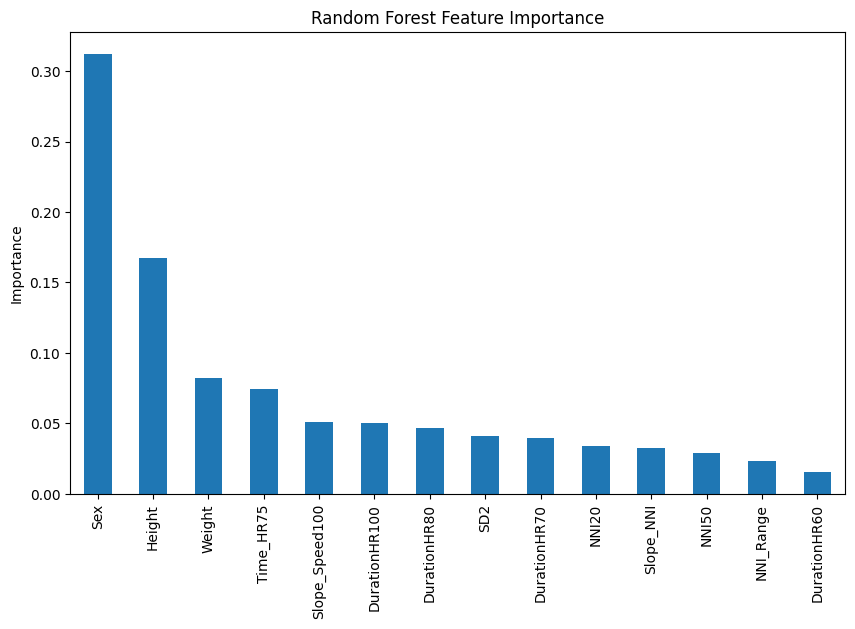

Feature importance scores:
Sex               0.312188
Height            0.167692
Weight            0.082095
Time_HR75         0.074286
Slope_Speed100    0.051031
DurationHR100     0.050370
DurationHR80      0.046505
SD2               0.040926
DurationHR70      0.039997
NNI20             0.033843
Slope_NNI         0.032842
NNI50             0.028869
NNI_Range         0.023495
DurationHR60      0.015862
dtype: float64


In [29]:
# Random Forest Feature Importance Exercise
feature_importance_exercise = random_forest_feature_importance(final_data_exercise, 'VO2max')
print("Feature importance scores:")
print(feature_importance_exercise)

Sex: This feature has the highest importance, indicating that gender is the most influential predictor for the target variable. It’s common in health-related models for sex to play a significant role, as physiological differences between males and females can affect physical performance. 

Height: Height is the second most important feature. This is reasonable, as height could correlate with body composition, which influences endurance and performance metrics.

Weight: Weight is important but less so than sex and height. It can influence performance and fitness levels, especially in terms of endurance and power-to-weight ratios.

The first 10 components seem to be the most interesting ones. After the 10th feature the importance doesn't significantally decrease. So it's useful to consider the first 10 for model evaluation in the exercise data.

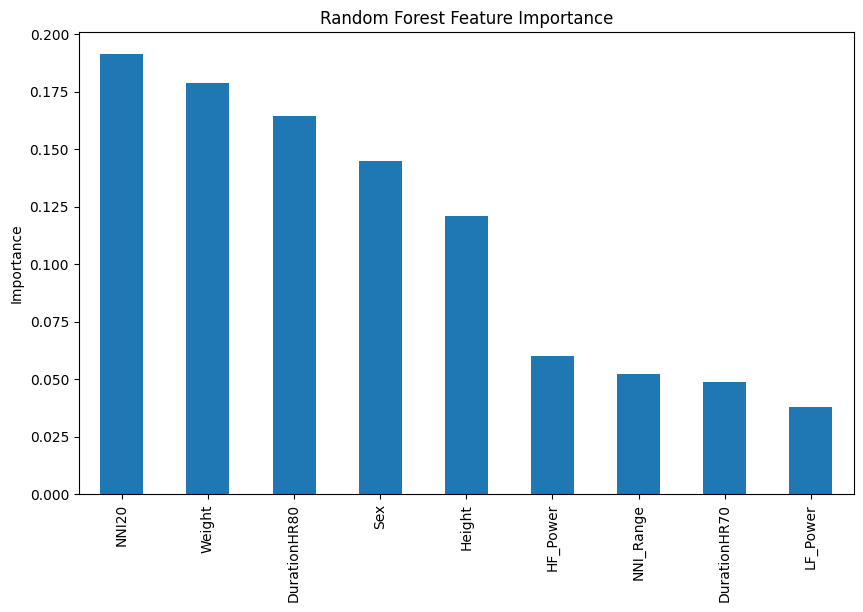

Feature importance scores:
NNI20           0.191366
Weight          0.178962
DurationHR80    0.164266
Sex             0.144953
Height          0.120945
HF_Power        0.060142
NNI_Range       0.052387
DurationHR70    0.048888
LF_Power        0.038093
dtype: float64


In [30]:
# Random Forest Feature Importance Recovery
feature_importance_recovery = random_forest_feature_importance(final_data_recovery, 'VO2max')
print("Feature importance scores:")
print(feature_importance_recovery)


NNI20: The variability in heart rate during recovery (or the NNI feature specifically) plays a significant role in predicting recovery outcomes. This aligns with the understanding that heart rate variability is a key indicator of recovery and autonomic nervous system function.

Weight: Weight is also highly important in the recovery model. This makes sense because body composition (weight) can influence recovery rates, with lighter individuals sometimes recovering more quickly due to less cardiovascular stress or greater endurance.

DurationHR80: Duration at 80% of maximum heart rate is another important feature. This suggests that the amount of time spent at a relatively high intensity (80% of max HR) during recovery is correlated with recovery performance. It could indicate how well an individual sustains exertion or handles exertion during the recovery phase.

The first 8 components seem to be the most interesting ones. After the 8th feature the importance doesn't significantally decrease. So it's useful to consider the first 8 for model evaluation in the exercise data.

#### Recursive Feature Elimination (RFE)
RFE is a technique that selects features by recursively removing the least important features based on model performance. RFE removes features one by one, based on their importance, until only a specified number of features remain.

In [32]:
# Recursive Feature Elimination (RFE)

def rfe_feature_selection(data, target_column, model, num_features=13):
    """
    This function performs Recursive Feature Elimination (RFE) to select the top features 
    based on their importance in predicting the target variable. It uses Random Forest Regressor as the model.

    Parameters:
        data (pd.DataFrame): The input dataframe containing features and target.
        target_column (str): The name of the target column.
        num_features (int): The number of top features to select (default is 5).

    Returns:
        list: A list containing the selected feature names.
    """
    # Separate the features and target variable
    X = data.drop(columns=[target_column])
    y = data[target_column]
    
    # Initialize the model (Random Forest Regressor)
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    
    # Initialize RFE with the RandomForest model and the desired number of features to select
    selector = RFE(rf, n_features_to_select=num_features)
    selector = selector.fit(X, y)
    
    # Get the selected features based on the RFE process
    selected_features = X.columns[selector.support_]
    
    return selected_features

#### Greedy-Forward-Backward-Selection
This method performs a greedy selection of features by iteratively adding or removing features based on model performance.

Forward Selection: Starts with an empty feature set and adds the most significant features one by one.

Backward Elimination: Starts with all features and removes the least significant ones.

In [40]:
# greedy forward backward feature selection


def forward_backward_feature_selection(data, target_column, model, n_features, direction='both', scoring='neg_mean_squared_error', cv=5):
    """
    Perform greedy feature selection (forward, backward, or both) to find the optimal feature set.

    Parameters:
        data (pd.DataFrame): The dataset containing features and target.
        target_column (str): The name of the target column.
        model (object): A Scikit-learn compatible ML model for evaluation.
        direction (str): The strategy for feature selection ('forward', 'backward', or 'both').
        scoring (str): Scoring metric for model evaluation during feature selection.
        cv (int): Number of cross-validation folds.

    Returns:
        list: List of the final selected features.
        float: Performance (MSE) of the final model on the test set.
    """
    # Step 1: Separate features and target
    X = data.drop(columns=[target_column])  # Features
    y = data[target_column]  # Target variable

    # Step 2: Split dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Step 3: Initialize forward feature selection
    if direction in ['forward', 'both']:
        forward_selector = SequentialFeatureSelector(
            model,
            n_features_to_select=n_features,  # Automatically determines the best number of features
            direction="forward",  # Forward selection
            scoring=scoring,  # Evaluation metric
            cv=cv,  # Cross-validation folds
            n_jobs=-1  # Use all available processors
        )
        forward_selector.fit(X_train, y_train)
        forward_features = X_train.columns[forward_selector.get_support()].tolist()
    else:
        forward_features = X.columns.tolist()  # Skip forward step if not needed

    # Step 4: Update training and testing data to include only forward-selected features
    X_train_forward = X_train[forward_features]
    X_test_forward = X_test[forward_features]
    
    pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())])

    # Extract model from pipeline
    model = pipeline.named_steps['model']

    # Step 5: Initialize backward feature elimination
    if direction in ['backward', 'both']:
        backward_selector = SequentialFeatureSelector(
            model,
            n_features_to_select=n_features-1,  # Automatically determines the best number of features
            direction="backward",  # Backward elimination
            scoring=scoring,  # Evaluation metric
            cv=cv,  # Cross-validation folds
            n_jobs=-1  # Use all available processors
        )
        backward_selector.fit(X_train_forward, y_train)
        final_features = X_train_forward.columns[backward_selector.get_support()].tolist()
    else:
        final_features = forward_features  # Skip backward step if not needed

    # Step 6: Train the final model using the selected features
    model.fit(X_train[final_features], y_train)
    y_pred = model.predict(X_test[final_features])

    # Step 7: Evaluate model performance
    performance = mean_squared_error(y_test, y_pred)
    #print('Performance (MSE):', performance)
    #print(y_test)
    #print(y_pred)
    return final_features



## Model Fitting & Hyperparameter Tuning

### Grid Search
It involves systematically testing a predefined set of hyperparameters for a given model to find the best combination. The process works by exhaustively searching through a grid of hyperparameters, training and evaluating the model for each possible combination, and then selecting the configuration that produces the best performance (usually based on cross-validation).

In [175]:
# evaluation function with grid search for hyperparameters

def model_evaluation_with_grid_search(dataframe, target_column, feature_selection_function, num_features=5, cv=5):
    """
    Function to evaluate multiple machine learning models with grid search for hyperparameter tuning and cross-validation.

    Parameters:
    dataframe (pandas.DataFrame): The dataset containing features and the target variable.
    target_column (str): The name of the target column in the dataframe.
    feature_selection_function (function): A function for selecting the most important features.
    num_features (int): The number of top features to select (default is 5).
    cv (int): The number of cross-validation folds (default is 5).

    Returns:
    pd.DataFrame: A DataFrame containing the evaluation metrics for each model.
    """
    
    # Models for predicting the target variable (e.g., VO2max)
    models = {
        'Random Forest': RandomForestRegressor(random_state=42),
        'XGBoost': XGBRegressor(random_state=42),
        'SVR': SVR(),
        'Linear Regression': LinearRegression()
    }
    
    # Pipeline for scaling + model training
    def create_pipeline(model):
        return Pipeline([
            ('scaler', StandardScaler()),  # Scaling step
            ('model', model)               # Model step
        ])
    
    # Hyperparameter tuning for models that support it
    param_grids = {
        'Random Forest': {
            'model__n_estimators': [50, 100, 200],
            'model__max_depth': [None, 10, 20, 30],
            'model__min_samples_split': [2, 5, 10]
        },
        'XGBoost': {
            'model__n_estimators': [50, 100, 200],
            'model__learning_rate': [0.01, 0.1, 0.2],
            'model__max_depth': [3, 6, 10]
        },
        'SVR': {
            'model__C': [0.1, 1, 10],
            'model__kernel': ['linear', 'rbf'],
            'model__gamma': ['scale', 'auto']
        },
        'Linear Regression': {}  # No hyperparameters for Linear Regression
    }
    
    # Function for evaluating models with cross-validation
    def evaluate_model(model, param_grid, X, y, cv=5):
        # Create pipeline with scaling and model
        pipeline = create_pipeline(model)
        
        # GridSearchCV for hyperparameter tuning with cross-validation
        if param_grid:
            grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='neg_mean_squared_error')
            grid_search.fit(X, y)
            best_model = grid_search.best_estimator_
            best_params = grid_search.best_params_
            best_score = grid_search.best_score_
            print(f"Best Hyperparameters for {model.__class__.__name__}: {best_params}")
            print(f"Best Cross-validation MSE for {model.__class__.__name__}: {-best_score}")
        else:
            # No grid search for models without hyperparameter tuning
            pipeline.fit(X, y)
            best_model = pipeline
            best_params = None
            best_score = None
        
        return best_model, best_params, best_score
    
    # Store results in a list of dictionaries
    metrics_results = []

    # Loop through each model for evaluation
    for model_name, model in models.items():
        print(f"Evaluating {model_name}...")
            
        # Perform feature selection
        selected_features = feature_selection_function(dataframe, target_column, model, num_features)  # Feature selection
        
        # Prepare the features (X) and target column (y)
        X_selected = dataframe[selected_features]
        y_selected = dataframe[target_column]
        
        # Perform hyperparameter tuning and find the best parameters
        best_model, best_params, best_score = evaluate_model(model, param_grids.get(model_name), X_selected, y_selected, cv)
        
        # Final prediction and evaluation of the best model
        y_pred = best_model.predict(X_selected)
        
        # Calculate evaluation metrics
        mse = mean_squared_error(y_selected, y_pred)
        mae = mean_absolute_error(y_selected, y_pred)
        r2 = r2_score(y_selected, y_pred)
        max_err = max_error(y_selected, y_pred)
        min_err = np.min(np.abs(y_selected - y_pred))
        mean_err = np.mean(np.abs(y_selected - y_pred))
        std_err = np.std(np.abs(y_selected - y_pred))
        
        # Append metrics to the results list
        metrics_results.append({
            'Model': model_name,
            'Max Error': max_err,
            'Min Error': min_err,
            'Mean Error': mean_err,
            'Std Deviation': std_err,
            'MSE': mse,
            'MAE': mae,
            'R2': r2
        })
        
        print(f"Final MSE for {model_name}: {mse}\n")

    # Create and return a DataFrame with the metrics
    results_df = pd.DataFrame(metrics_results).set_index('Model')
    print("\nEvaluation Metrics Summary:\n", results_df)
    return results_df


#### Predictions with differnet Feature Selection Methods
##### Exercise

In [176]:
# with recursive feature selection
exercise_rfs_grid_df = model_evaluation_with_grid_search(final_data_exercise, target_column='VO2max', 
                                  feature_selection_function=rfe_feature_selection, 
                                  num_features=10, cv=5)
exercise_rfs_grid_df

Evaluating Random Forest...
Best Hyperparameters for RandomForestRegressor: {'model__max_depth': 10, 'model__min_samples_split': 5, 'model__n_estimators': 100}
Best Cross-validation MSE for RandomForestRegressor: 0.46031123060747825
Final MSE for Random Forest: 0.13811271744740108

Evaluating XGBoost...
Best Hyperparameters for XGBRegressor: {'model__learning_rate': 0.1, 'model__max_depth': 3, 'model__n_estimators': 100}
Best Cross-validation MSE for XGBRegressor: 0.4600673749794648
Final MSE for XGBoost: 0.2412885462254209

Evaluating SVR...
Best Hyperparameters for SVR: {'model__C': 1, 'model__gamma': 'scale', 'model__kernel': 'linear'}
Best Cross-validation MSE for SVR: 0.47427308892167624
Final MSE for SVR: 0.4439204149160978

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.4402870950260103


Evaluation Metrics Summary:
                    Max Error  Min Error  Mean Error  Std Deviation       MSE  \
Model                                                           

,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,
Random Forest,1.368363,0.000210,0.290877,0.231308,0.138113,0.290877,0.861887
XGBoost,1.880819,0.000461,0.384298,0.305947,0.241289,0.384298,0.758711
SVR,2.903683,0.000056,0.517351,0.419844,0.443920,0.517351,0.556080
Linear Regression,2.805751,0.001875,0.520036,0.412129,0.440287,0.520036,0.559713


In [117]:
# with forward_backward_feature_selection function
exercise_fbs_grid_df = model_evaluation_with_grid_search(final_data_exercise, target_column='VO2max',
                                  feature_selection_function=forward_backward_feature_selection, 
                                  num_features=10, cv=5)
exercise_fbs_grid_df

Evaluating Random Forest...
Best Hyperparameters for RandomForestRegressor: {'model__max_depth': 10, 'model__min_samples_split': 10, 'model__n_estimators': 100}
Best Cross-validation MSE for RandomForestRegressor: 0.4739846361016107
Final MSE for Random Forest: 0.17861888910367604

Evaluating XGBoost...
Best Hyperparameters for XGBRegressor: {'model__learning_rate': 0.1, 'model__max_depth': 3, 'model__n_estimators': 100}
Best Cross-validation MSE for XGBRegressor: 0.4640234556895243
Final MSE for XGBoost: 0.26378986493971407

Evaluating SVR...
Best Hyperparameters for SVR: {'model__C': 0.1, 'model__gamma': 'scale', 'model__kernel': 'linear'}
Best Cross-validation MSE for SVR: 0.4649242856263417
Final MSE for SVR: 0.43856739383257515

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.43811709782478214


Evaluation Metrics Summary:
                    Max Error  Min Error  Mean Error  Std Deviation       MSE  \
Model                                                       

,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,
Random Forest,1.620088,0.000422,0.332062,0.261445,0.178619,0.332062,0.821381
XGBoost,2.291974,0.000596,0.397252,0.325547,0.263790,0.397252,0.736210
SVR,2.864866,0.000978,0.517796,0.412862,0.438567,0.517796,0.561433
Linear Regression,2.726499,0.000396,0.518464,0.411476,0.438117,0.518464,0.561883


In [118]:
# with random forest feature selection
exercise_rff_grid_df = model_evaluation_with_grid_search(final_data_exercise, target_column='VO2max',
                                  feature_selection_function=random_forest_feature_selection, 
                                  num_features=10, cv=5)
exercise_rff_grid_df

Evaluating Random Forest...
Best Hyperparameters for RandomForestRegressor: {'model__max_depth': 10, 'model__min_samples_split': 5, 'model__n_estimators': 100}
Best Cross-validation MSE for RandomForestRegressor: 0.46035255999806274
Final MSE for Random Forest: 0.1385305655152354

Evaluating XGBoost...
Best Hyperparameters for XGBRegressor: {'model__learning_rate': 0.1, 'model__max_depth': 3, 'model__n_estimators': 100}
Best Cross-validation MSE for XGBRegressor: 0.46012176050073317
Final MSE for XGBoost: 0.2412885462254209

Evaluating SVR...
Best Hyperparameters for SVR: {'model__C': 1, 'model__gamma': 'scale', 'model__kernel': 'linear'}
Best Cross-validation MSE for SVR: 0.4742730889217147
Final MSE for SVR: 0.4439204149160961

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.4402870950260103


Evaluation Metrics Summary:
                    Max Error  Min Error  Mean Error  Std Deviation       MSE  \
Model                                                            

,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,
Random Forest,1.368363,0.000189,0.291349,0.231617,0.138531,0.291349,0.861469
XGBoost,1.880819,0.000461,0.384298,0.305947,0.241289,0.384298,0.758711
SVR,2.903683,0.000056,0.517351,0.419844,0.443920,0.517351,0.556080
Linear Regression,2.805751,0.001875,0.520036,0.412129,0.440287,0.520036,0.559713


##### Recovery

In [120]:
# with recursive feature selection
recovery_rfs_grid_df = model_evaluation_with_grid_search(final_data_recovery, target_column='VO2max', 
                                  feature_selection_function=rfe_feature_selection, 
                                  num_features=10, cv=5)
recovery_rfs_grid_df

Evaluating Random Forest...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/feature_selection/_rfe.py:291: UserWarning: Found n_features_to_select=10 > n_features=9. There will be no feature selection and all features will be kept.
  warnings.warn(


Best Hyperparameters for RandomForestRegressor: {'model__max_depth': 10, 'model__min_samples_split': 10, 'model__n_estimators': 100}
Best Cross-validation MSE for RandomForestRegressor: 0.4767807826634998
Final MSE for Random Forest: 0.1679672458279804

Evaluating XGBoost...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/feature_selection/_rfe.py:291: UserWarning: Found n_features_to_select=10 > n_features=9. There will be no feature selection and all features will be kept.
  warnings.warn(


Best Hyperparameters for XGBRegressor: {'model__learning_rate': 0.1, 'model__max_depth': 3, 'model__n_estimators': 50}
Best Cross-validation MSE for XGBRegressor: 0.47552703748867103
Final MSE for XGBoost: 0.20021715644490234

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/feature_selection/_rfe.py:291: UserWarning: Found n_features_to_select=10 > n_features=9. There will be no feature selection and all features will be kept.
  warnings.warn(


Best Hyperparameters for SVR: {'model__C': 1, 'model__gamma': 'scale', 'model__kernel': 'rbf'}
Best Cross-validation MSE for SVR: 0.6051054144062984
Final MSE for SVR: 0.35060759491070875

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.5674620680920428


Evaluation Metrics Summary:
                    Max Error  Min Error  Mean Error  Std Deviation       MSE  \
Model                                                                          
Random Forest       1.437727   0.001669    0.322734       0.252606  0.167967   
XGBoost             1.412935   0.000786    0.344257       0.285839  0.200217   
SVR                 1.996115   0.002957    0.428387       0.408769  0.350608   
Linear Regression   2.493333   0.001492    0.569095       0.493551  0.567462   

                        MAE        R2  
Model                                  
Random Forest      0.322734  0.832033  
XGBoost            0.344257  0.799783  
SVR                0.428387  0.649392  
Linear Regressi

/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/feature_selection/_rfe.py:291: UserWarning: Found n_features_to_select=10 > n_features=9. There will be no feature selection and all features will be kept.
  warnings.warn(


,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,
Random Forest,1.437727,0.001669,0.322734,0.252606,0.167967,0.322734,0.832033
XGBoost,1.412935,0.000786,0.344257,0.285839,0.200217,0.344257,0.799783
SVR,1.996115,0.002957,0.428387,0.408769,0.350608,0.428387,0.649392
Linear Regression,2.493333,0.001492,0.569095,0.493551,0.567462,0.569095,0.432538


In [122]:
# with forward_backward_feature_selection function
recovery_fbs_grid_df = model_evaluation_with_grid_search(final_data_recovery, target_column='VO2max',
                                  feature_selection_function=forward_backward_feature_selection, 
                                  num_features=7, cv=5)
recovery_fbs_grid_df

Evaluating Random Forest...
Best Hyperparameters for RandomForestRegressor: {'model__max_depth': 10, 'model__min_samples_split': 10, 'model__n_estimators': 200}
Best Cross-validation MSE for RandomForestRegressor: 0.5172199267640603
Final MSE for Random Forest: 0.19861518361353445

Evaluating XGBoost...
Best Hyperparameters for XGBRegressor: {'model__learning_rate': 0.1, 'model__max_depth': 3, 'model__n_estimators': 50}
Best Cross-validation MSE for XGBRegressor: 0.5150019104894916
Final MSE for XGBoost: 0.24159340772644844

Evaluating SVR...
Best Hyperparameters for SVR: {'model__C': 1, 'model__gamma': 'scale', 'model__kernel': 'rbf'}
Best Cross-validation MSE for SVR: 0.5766251999262957
Final MSE for SVR: 0.3794897682730048

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.5718082329572274


Evaluation Metrics Summary:
                    Max Error  Min Error  Mean Error  Std Deviation       MSE  \
Model                                                               

,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,
Random Forest,1.318188,0.000289,0.352700,0.272429,0.198615,0.352700,0.801385
XGBoost,1.536904,0.000174,0.386878,0.303181,0.241593,0.386878,0.758407
SVR,2.097226,0.003649,0.464344,0.404814,0.379490,0.464344,0.620510
Linear Regression,2.576267,0.000195,0.564793,0.502809,0.571808,0.564793,0.428192


In [123]:
# with random forest feature selection
recovery_rff_grid_df = model_evaluation_with_grid_search(final_data_recovery, target_column='VO2max',
                                  feature_selection_function=random_forest_feature_selection, 
                                  num_features=7, cv=5)
recovery_rff_grid_df

Evaluating Random Forest...
Best Hyperparameters for RandomForestRegressor: {'model__max_depth': 10, 'model__min_samples_split': 10, 'model__n_estimators': 100}
Best Cross-validation MSE for RandomForestRegressor: 0.49619142257521387
Final MSE for Random Forest: 0.18301709123028087

Evaluating XGBoost...
Best Hyperparameters for XGBRegressor: {'model__learning_rate': 0.1, 'model__max_depth': 3, 'model__n_estimators': 50}
Best Cross-validation MSE for XGBRegressor: 0.4826059343761998
Final MSE for XGBoost: 0.22305662207773677

Evaluating SVR...
Best Hyperparameters for SVR: {'model__C': 1, 'model__gamma': 'scale', 'model__kernel': 'rbf'}
Best Cross-validation MSE for SVR: 0.5935679883304831
Final MSE for SVR: 0.3621396434290733

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.5682416855032874


Evaluation Metrics Summary:
                    Max Error  Min Error  Mean Error  Std Deviation       MSE  \
Model                                                              

,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,
Random Forest,1.428141,0.001248,0.335854,0.264989,0.183017,0.335854,0.816983
XGBoost,1.643413,0.001238,0.362962,0.302184,0.223057,0.362962,0.776943
SVR,2.010766,0.000853,0.436764,0.413977,0.362140,0.436764,0.637860
Linear Regression,2.504775,0.003484,0.567000,0.496742,0.568242,0.567000,0.431758


### Random Search

Instead of testing all possible combinations of parameters like in Grid Search, Random Search randomly selects a set of hyperparameters from a predefined range. It then trains and evaluates the model using these parameters. This process is repeated for a set number of iterations.

In [124]:
# hyperparameter tuning with random search

def model_evaluation_with_random_search(dataframe, target_column, feature_selection_function, num_features=5, cv=5):
    """
    Function to evaluate multiple machine learning models with randomized search for hyperparameter tuning and cross-validation.

    Parameters:
    dataframe (pandas.DataFrame): The dataset containing features and the target variable.
    target_column (str): The name of the target column in the dataframe.
    feature_selection_function (function): A function for selecting the most important features.
    num_features (int): The number of top features to select (default is 5).
    cv (int): The number of cross-validation folds (default is 5).

    Returns:
    pd.DataFrame: A DataFrame containing the evaluation metrics for each model.
    """
    
    # Models for predicting the target variable (e.g., VO2max)
    models = {
        'Random Forest': RandomForestRegressor(random_state=42),
        'XGBoost': XGBRegressor(random_state=42),
        'SVR': SVR(),
        'Linear Regression': LinearRegression()
    }
    
    # Pipeline for scaling + model training
    def create_pipeline(model):
        return Pipeline([
            ('scaler', StandardScaler()),  # Scaling step
            ('model', model)               # Model step
        ])
    
    # Hyperparameter distributions for random search
    param_distributions = {
        'Random Forest': {
            'model__n_estimators': [50, 100, 200, 300],
            'model__max_depth': [None, 10, 20, 30],
            'model__min_samples_split': [2, 5, 10],
        },
        'XGBoost': {
            'model__n_estimators': [50, 100, 200, 300],
            'model__learning_rate': [0.01, 0.1, 0.2],
            'model__max_depth': [3, 6, 10],
        },
        'SVR': {
            'model__C': [0.1, 1, 10, 100],
            'model__kernel': ['linear', 'rbf'],
            'model__gamma': ['scale', 'auto'],
        },
        'Linear Regression': {}  # No hyperparameters for Linear Regression
    }
    
    # Cross-validation strategy
    cv_strategy = KFold(n_splits=cv, shuffle=True, random_state=42)
    
    # Perform feature selection
    selected_features = feature_selection_function(dataframe, target_column, models['Random Forest'], num_features)
    X = dataframe[selected_features]
    y = dataframe[target_column]

    metrics_results = []

    # Loop through each model for evaluation
    for model_name, model in models.items():
        print(f"Evaluating {model_name}...")
        
        # Create pipeline
        pipeline = create_pipeline(model)
        
        # RandomizedSearchCV for hyperparameter tuning with cross-validation
        if param_distributions.get(model_name):
            search = RandomizedSearchCV(
                estimator=pipeline,
                param_distributions=param_distributions[model_name],
                n_iter=20,  # Number of iterations to sample random hyperparameters
                cv=cv_strategy,
                scoring='neg_mean_squared_error',
                n_jobs=-1,
                random_state=42
            )
        else:
            # For Linear Regression, no parameter tuning
            search = pipeline

        # Fit model and get the best parameters
        search.fit(X, y)
        best_model = search.best_estimator_ if isinstance(search, RandomizedSearchCV) else search
        best_params = search.best_params_ if isinstance(search, RandomizedSearchCV) else None
        best_score = -search.best_score_ if isinstance(search, RandomizedSearchCV) else None
        
        # Final prediction and evaluation of the best model
        y_pred = best_model.predict(X)
        
        # Calculate evaluation metrics
        mse = mean_squared_error(y, y_pred)
        mae = mean_absolute_error(y, y_pred)
        r2 = r2_score(y, y_pred)
        max_err = max_error(y, y_pred)
        min_err = np.min(np.abs(y - y_pred))
        mean_err = np.mean(np.abs(y - y_pred))
        std_err = np.std(np.abs(y - y_pred))
        
        # Append metrics to the results list
        metrics_results.append({
            'Model': model_name,
            'Best Hyperparameters': best_params,
            'Best Cross-validation MSE': best_score,
            'Max Error': max_err,
            'Min Error': min_err,
            'Mean Error': mean_err,
            'Std Deviation': std_err,
            'MSE': mse,
            'MAE': mae,
            'R2': r2
        })

        # Output results
        if best_params:
            print(f"Best Hyperparameters for {model_name}: {best_params}")
        print(f"Final MSE for {model_name}: {mse}\n")

    # Create and return a DataFrame with the metrics
    results_df = pd.DataFrame(metrics_results).set_index('Model')
    print("\nEvaluation Metrics Summary:\n", results_df)
    return results_df


#### Predictions with differnet Feature Selection Methods
##### Exercise

In [125]:
# with recursive feature selection
exercise_rfs_random_df = model_evaluation_with_random_search(final_data_exercise, target_column='VO2max', 
                                  feature_selection_function=rfe_feature_selection, 
                                  num_features=10, cv=5)
exercise_rfs_random_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 300, 'model__min_samples_split': 2, 'model__max_depth': 10}
Final MSE for Random Forest: 0.12020411909415456

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 50, 'model__max_depth': 3, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.29512276569559465

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'auto', 'model__C': 1}
Final MSE for SVR: 0.3012231385420908

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.4402870950260103


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 300, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 50, 'model__max_depth'...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'auto...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.445203   1.181527   0.000451   
XGBoost                             0.437782   2.193797   0.000139   
SVR                                 0.4

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 300, 'model__min_sampl...",0.445203,1.181527,0.000451,0.274275,0.212078,0.120204,0.274275,0.879796
XGBoost,"{'model__n_estimators': 50, 'model__max_depth'...",0.437782,2.193797,0.000139,0.426390,0.336622,0.295123,0.426390,0.704877
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'auto...",0.447729,2.868855,0.000741,0.399221,0.376624,0.301223,0.399221,0.698777
Linear Regression,None,NaN,2.805751,0.001875,0.520036,0.412129,0.440287,0.520036,0.559713


In [126]:
# with forward_backward_feature_selection function
exercise_fbs_random_df = model_evaluation_with_random_search(final_data_exercise, target_column='VO2max',
                                  feature_selection_function=forward_backward_feature_selection, 
                                  num_features=10, cv=5)
exercise_fbs_random_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 300, 'model__min_samples_split': 5, 'model__max_depth': 10}
Final MSE for Random Forest: 0.1419340835912057

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 50, 'model__max_depth': 3, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.3078061549632064

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'scale', 'model__C': 1}
Final MSE for SVR: 0.3130522851839921

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.4388104379505531


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 300, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 50, 'model__max_depth'...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'scal...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.458282   1.386570   0.000737   
XGBoost                             0.448173   2.409209   0.000163   
SVR                                 0.

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 300, 'model__min_sampl...",0.458282,1.386570,0.000737,0.295695,0.233449,0.141934,0.295695,0.858066
XGBoost,"{'model__n_estimators': 50, 'model__max_depth'...",0.448173,2.409209,0.000163,0.431876,0.348265,0.307806,0.431876,0.692194
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'scal...",0.445975,2.922088,0.000832,0.410265,0.380440,0.313052,0.410265,0.686948
Linear Regression,None,NaN,2.903912,0.000040,0.520036,0.410333,0.438810,0.520036,0.561190


In [127]:
# with random forest feature selection
exercise_rff_random_df = model_evaluation_with_random_search(final_data_exercise, target_column='VO2max',
                                  feature_selection_function=random_forest_feature_selection, 
                                  num_features=10, cv=5)
exercise_rff_random_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 300, 'model__min_samples_split': 5, 'model__max_depth': 10}
Final MSE for Random Forest: 0.13350272342373504

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 50, 'model__max_depth': 3, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.29512276569559465

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'auto', 'model__C': 1}
Final MSE for SVR: 0.3012231385420907

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.4402870950260103


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 300, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 50, 'model__max_depth'...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'auto...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.445691   1.366061   0.000590   
XGBoost                             0.437903   2.193797   0.000139   
SVR                                 0.4

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 300, 'model__min_sampl...",0.445691,1.366061,0.000590,0.286944,0.226199,0.133503,0.286944,0.866497
XGBoost,"{'model__n_estimators': 50, 'model__max_depth'...",0.437903,2.193797,0.000139,0.426390,0.336622,0.295123,0.426390,0.704877
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'auto...",0.447729,2.868855,0.000741,0.399221,0.376624,0.301223,0.399221,0.698777
Linear Regression,None,NaN,2.805751,0.001875,0.520036,0.412129,0.440287,0.520036,0.559713


##### Recovery

In [128]:
# with recursive feature selection
recovery_rfs_random_df = model_evaluation_with_random_search(final_data_recovery, target_column='VO2max', 
                                  feature_selection_function=rfe_feature_selection, 
                                  num_features=7, cv=5)
recovery_rfs_random_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 100, 'model__min_samples_split': 10, 'model__max_depth': 30}
Final MSE for Random Forest: 0.16326891072599176

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 50, 'model__max_depth': 3, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.21541023996384998

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'auto', 'model__C': 1}
Final MSE for SVR: 0.384334033157176

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.5701078117095459


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 100, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 50, 'model__max_depth'...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'auto...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.498930   1.554601   0.002166   
XGBoost                             0.468808   1.496270   0.006997   
SVR                                 0.57

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 100, 'model__min_sampl...",0.498930,1.554601,0.002166,0.314070,0.254222,0.163269,0.314070,0.836731
XGBoost,"{'model__n_estimators': 50, 'model__max_depth'...",0.468808,1.496270,0.006997,0.355962,0.297827,0.215410,0.355962,0.784590
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'auto...",0.574406,2.007932,0.000402,0.443116,0.433569,0.384334,0.443116,0.615666
Linear Regression,None,NaN,2.542807,0.000585,0.568150,0.497306,0.570108,0.568150,0.429892


In [129]:
# with forward_backward_feature_selection function
recovery_fbs_random_df = model_evaluation_with_random_search(final_data_recovery, target_column='VO2max',
                                  feature_selection_function=forward_backward_feature_selection, 
                                  num_features=7, cv=5)
recovery_fbs_random_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 100, 'model__min_samples_split': 10, 'model__max_depth': 20}
Final MSE for Random Forest: 0.17477302163187908

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 50, 'model__max_depth': 3, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.2556652516148568

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'scale', 'model__C': 1}
Final MSE for SVR: 0.38412098026970265

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.5783548295939375


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 100, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 50, 'model__max_depth'...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'scal...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.492443   1.280301   0.000954   
XGBoost                             0.494664   1.686944   0.000772   
SVR                                 0

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 100, 'model__min_sampl...",0.492443,1.280301,0.000954,0.327233,0.260176,0.174773,0.327233,0.825227
XGBoost,"{'model__n_estimators': 50, 'model__max_depth'...",0.494664,1.686944,0.000772,0.393567,0.317443,0.255665,0.393567,0.744335
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'scal...",0.552072,2.125625,0.000318,0.467977,0.406347,0.384121,0.467977,0.615879
Linear Regression,None,NaN,2.464911,0.000064,0.570598,0.502765,0.578355,0.570598,0.421645


In [130]:
# with random forest feature selection
recovery_rff_random_df = model_evaluation_with_random_search(final_data_recovery, target_column='VO2max',
                                  feature_selection_function=random_forest_feature_selection, 
                                  num_features=7, cv=5)
recovery_rff_random_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 100, 'model__min_samples_split': 10, 'model__max_depth': 20}
Final MSE for Random Forest: 0.15957787896025255

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 50, 'model__max_depth': 3, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.22305662207773677

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'scale', 'model__C': 1}
Final MSE for SVR: 0.3621396434290733

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.5682416855032874


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 100, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 50, 'model__max_depth'...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'scal...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.501277   1.411290   0.001589   
XGBoost                             0.488563   1.643413   0.001238   
SVR                                 0.

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 100, 'model__min_sampl...",0.501277,1.411290,0.001589,0.309818,0.252172,0.159578,0.309818,0.840422
XGBoost,"{'model__n_estimators': 50, 'model__max_depth'...",0.488563,1.643413,0.001238,0.362962,0.302184,0.223057,0.362962,0.776943
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'scal...",0.559548,2.010766,0.000853,0.436764,0.413977,0.362140,0.436764,0.637860
Linear Regression,None,NaN,2.504775,0.003484,0.567000,0.496742,0.568242,0.567000,0.431758


# Data Generation with tsfel

TSFEL (Time Series Feature Extraction Library) is a Python library designed to simplify the extraction of features from time-series data. It automates the feature engineering process by extracting a wide range of statistical, spectral, and temporal features from the data.

In [131]:
import tsfel

In [132]:
# Prepare datasets for TSFEL usage
# TSFEL requires time-series data to be clean and organized, with numeric types for processing.

# Ensure 'time' column in exercise_data is numeric for proper time-series analysis
exercise_data['time'] = pd.to_numeric(exercise_data['time'])

# Ensure 'VO2' column (oxygen consumption) is numeric for feature extraction
exercise_data['VO2'] = pd.to_numeric(exercise_data['VO2'])

# Convert 'ID_test' (identifier for tests) to string for proper grouping and sorting
exercise_data['ID_test'] = exercise_data['ID_test'].astype(str)

# Repeat the same steps for the recovery data
recovery_data['time'] = pd.to_numeric(recovery_data['time'])
recovery_data['VO2'] = pd.to_numeric(recovery_data['VO2'])
recovery_data['ID_test'] = recovery_data['ID_test'].astype(str)

# Organize and sort the exercise data
# Sort the dataset by 'ID_test' (to group time-series per test) and 'time' (chronological order)
# Reset index after sorting for a clean DataFrame
exercise_data_tsfel = exercise_data.sort_values(by=['ID_test', 'time']).reset_index(drop=True)

# Organize and sort the recovery data similarly
recovery_data_tsfel = recovery_data.sort_values(by=['ID_test', 'time']).reset_index(drop=True)


In [133]:
# Function to segment time series into dynamic time windows
def segment_time_series_dynamic(group, window_size):
    """
    Segments a time series into dynamic time windows based on irregular time intervals.

    Parameters:
        group (DataFrame): A subset of the dataset grouped by ID or another identifier.
        window_size (int): The size of the time window in seconds.

    Returns:
        DataFrame: A DataFrame containing aggregated features and metadata for each time window.
    """
    results = []
    times = group['time'].values  # Extract time values
    vo2_values = group['VO2'].values  # Extract VO2 values

    start_idx = 0
    while start_idx < len(times):
        # Dynamically calculate the end time for the current window
        end_time = times[start_idx] + window_size
        end_idx = np.searchsorted(times, end_time)

        # Extract the data within the current time window
        window_data = group.iloc[start_idx:end_idx]

        # Skip window if it contains too few data points (minimum 3 for slope calculation)
        if len(window_data) < 3:
            start_idx = end_idx
            continue

        # Remove NaN and invalid values
        window_data = window_data.dropna()
        if window_data.empty:
            start_idx = end_idx
            continue

        # Calculate VO2_max for the window
        vo2_max = vo2_values[start_idx:end_idx].max()

        # TSFEL requires time series data as a NumPy array
        ts_data = window_data[['Speed', 'HR', 'VCO2', 'RR', 'VE', 'HR_diff']]

        # Calculate features for each column in the time series
        aggregated_features = {}
        for col in ts_data.columns:
            try:
                cfg_file = tsfel.get_features_by_domain("temporal")  # Temporal features
                tsfel_features = tsfel.time_series_features_extractor(cfg_file, ts_data[col].values, verbose=0)

                # Rename columns to include the metric name
                tsfel_features.columns = [f"{col}_{feature}" for feature in tsfel_features.columns]

                # Add features to the aggregated dictionary
                aggregated_features.update(tsfel_features.iloc[0].to_dict())
            except Exception as e:
                print(f"Error in column {col}: {e}")

        # Add additional metadata
        aggregated_features['ID_test'] = group['ID_test'].iloc[0]
        #aggregated_features['time_start'] = times[start_idx]
        #aggregated_features['time_end'] = times[end_idx - 1] if end_idx < len(times) else times[-1]
        aggregated_features['VO2_max'] = vo2_max

        # Append the results for the current window
        results.append(aggregated_features)

        # Move to the next time window
        start_idx = end_idx

    return pd.DataFrame(results)


#### What window size?
The window size refers to how much data is used for each segment (or window) in the time series, from which features will be extracted. The window size should be large enough to capture meaningful patterns but not too large to obscure the underlying structure.

Here the patient gets measured for 5 min, included many variable features like heart rate. For heart rates usually a window between 10-30 seconds is best. 

Another thing to consider is the trade-off between resolution and computational complexity due to high data amounts. This got a big problem here. The desired 30s window would result in hours of computation time, why now a window of 90s is used. This could lead to not captuaring all inforamtion, but has a faster computation.

In [134]:
# Aggregate data by ID and time window
window_size = 90  # Time window in seconds
exercise_tsfel_results = pd.concat([
    segment_time_series_dynamic(group, window_size)
    for _, group in exercise_data_tsfel.groupby("ID_test")
])

window_size = 90  # Time window in seconds
recovery_tsfel_results = pd.concat([
    segment_time_series_dynamic(group, window_size)
    for _, group in recovery_data_tsfel.groupby("ID_test")
])

/var/folders/bd/3yf697f17xx34gzbkjr3wz9r0000gn/T/ipykernel_37568/3786209464.py:48: UserWarning: Using default sampling frequency set in configuration file.
  tsfel_features = tsfel.time_series_features_extractor(cfg_file, ts_data[col].values, verbose=0)
/var/folders/bd/3yf697f17xx34gzbkjr3wz9r0000gn/T/ipykernel_37568/3786209464.py:48: UserWarning: Using default sampling frequency set in configuration file.
  tsfel_features = tsfel.time_series_features_extractor(cfg_file, ts_data[col].values, verbose=0)
/var/folders/bd/3yf697f17xx34gzbkjr3wz9r0000gn/T/ipykernel_37568/3786209464.py:48: UserWarning: Using default sampling frequency set in configuration file.
  tsfel_features = tsfel.time_series_features_extractor(cfg_file, ts_data[col].values, verbose=0)
/var/folders/bd/3yf697f17xx34gzbkjr3wz9r0000gn/T/ipykernel_37568/3786209464.py:48: UserWarning: Using default sampling frequency set in configuration file.
  tsfel_features = tsfel.time_series_features_extractor(cfg_file, ts_data[col].val

### Prepare Data like before

In [146]:
# merge to subject data

exercise_tsfel = pd.merge(subject_data, exercise_tsfel_results, on='ID_test', how='inner')
recovery_tsfel = pd.merge(subject_data, recovery_tsfel_results, on='ID_test', how='inner')
exercise_tsfel = exercise_tsfel.drop(columns=['ID_test', 'ID'])
recovery_tsfel = recovery_tsfel.drop(columns=['ID_test', 'ID'])

In [147]:
# normalize data

normalized_exercise_tsfel = normalize_features(exercise_tsfel)
normalized_recovery_tsfel = normalize_features(recovery_tsfel)

In [148]:
# feature selection for exercise

final_exercise_data_tsfel = feature_selection_pipeline(
    normalized_exercise_tsfel, target_column='VO2_max', 
    corr_threshold=0.7, 
    nan_threshold=0.5, 
    mi_threshold=0.0, 
    spearman_threshold=0.1,
    correlation_fs = False, nan_fs = True, mi_fs = True, spearman_fs = True
)

Features to remove with more than 50.0% NaN values: Index([], dtype='object')
Selected Features (MI > 0.0): ['Speed_0_Centroid', 'VCO2_0_Area under the curve', 'Speed_0_Area under the curve', 'HR_0_Centroid', 'VE_0_Area under the curve', 'Speed_0_Mean diff', 'Speed_0_Mean absolute diff', 'Speed_0_Sum absolute diff', 'Speed_0_Signal distance', 'Speed_0_Slope', 'VE_0_Mean diff', 'VCO2_0_Sum absolute diff', 'VCO2_0_Signal distance', 'VE_0_Slope', 'VE_0_Mean absolute diff', 'VCO2_0_Slope', 'VCO2_0_Centroid', 'VE_0_Sum absolute diff', 'VCO2_0_Mean diff', 'VCO2_0_Median diff', 'HR_0_Mean diff', 'Height', 'Weight', 'VCO2_0_Mean absolute diff', 'VE_0_Signal distance', 'VE_0_Centroid', 'HR_0_Area under the curve', 'Speed_0_Median absolute diff', 'Sex', 'Speed_0_Median diff', 'HR_0_Signal distance', 'HR_0_Slope', 'VE_0_Median diff', 'HR_diff_0_Signal distance', 'HR_0_Positive turning points', 'VE_0_Median absolute diff', 'HR_0_Median diff', 'RR_0_Median diff', 'RR_0_Centroid', 'VCO2_0_Median abs

/var/folders/bd/3yf697f17xx34gzbkjr3wz9r0000gn/T/ipykernel_37568/4162519989.py:23: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  correlation, _ = spearmanr(dataframe[column], dataframe[target_column])


In [149]:
# feature selection for recovery

final_recovery_data_tsfel = feature_selection_pipeline(
    normalized_recovery_tsfel, target_column='VO2_max', 
    corr_threshold=0.7, 
    nan_threshold=0.5, 
    mi_threshold=0.0, 
    spearman_threshold=0.1,
    correlation_fs = False, nan_fs = True, mi_fs = True, spearman_fs = True
)

Features to remove with more than 50.0% NaN values: Index([], dtype='object')
Selected Features (MI > 0.0): ['VCO2_0_Area under the curve', 'VE_0_Area under the curve', 'VCO2_0_Signal distance', 'VCO2_0_Sum absolute diff', 'HR_0_Area under the curve', 'VE_0_Signal distance', 'Speed_0_Signal distance', 'Speed_0_Area under the curve', 'HR_0_Centroid', 'Speed_0_Centroid', 'RR_0_Area under the curve', 'VE_0_Sum absolute diff', 'RR_0_Centroid', 'VE_0_Centroid', 'HR_0_Sum absolute diff', 'VCO2_0_Centroid', 'HR_diff_0_Area under the curve', 'HR_0_Signal distance', 'HR_diff_0_Signal distance', 'RR_0_Signal distance', 'HR_diff_0_Positive turning points', 'HR_diff_0_Centroid', 'RR_0_Sum absolute diff', 'VE_0_Positive turning points', 'VCO2_0_Mean absolute diff', 'VE_0_Negative turning points', 'HR_diff_0_Sum absolute diff', 'VCO2_0_Slope', 'VCO2_0_Mean diff', 'VE_0_Slope', 'VCO2_0_Median diff', 'VE_0_Mean diff', 'VCO2_0_Positive turning points', 'VCO2_0_Median absolute diff', 'VE_0_Mean absolute

/var/folders/bd/3yf697f17xx34gzbkjr3wz9r0000gn/T/ipykernel_37568/4162519989.py:23: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  correlation, _ = spearmanr(dataframe[column], dataframe[target_column])


## Feature selection and Dimensioanlity Reduction

#### Pearson Correlation
Due to tsfel we have more noraml distributed and linear correlated data, which makes sense to reomove now via Pearson correlation. 

The correlation matrix calculates pairwise correlation coefficients between features. The value ranges between -1 and 1:

+1: Perfect positive correlation.

-1: Perfect negative correlation.

0: No linear relationship.

Features with high correlation contain redundant information. The heatmap highlights such correlations.

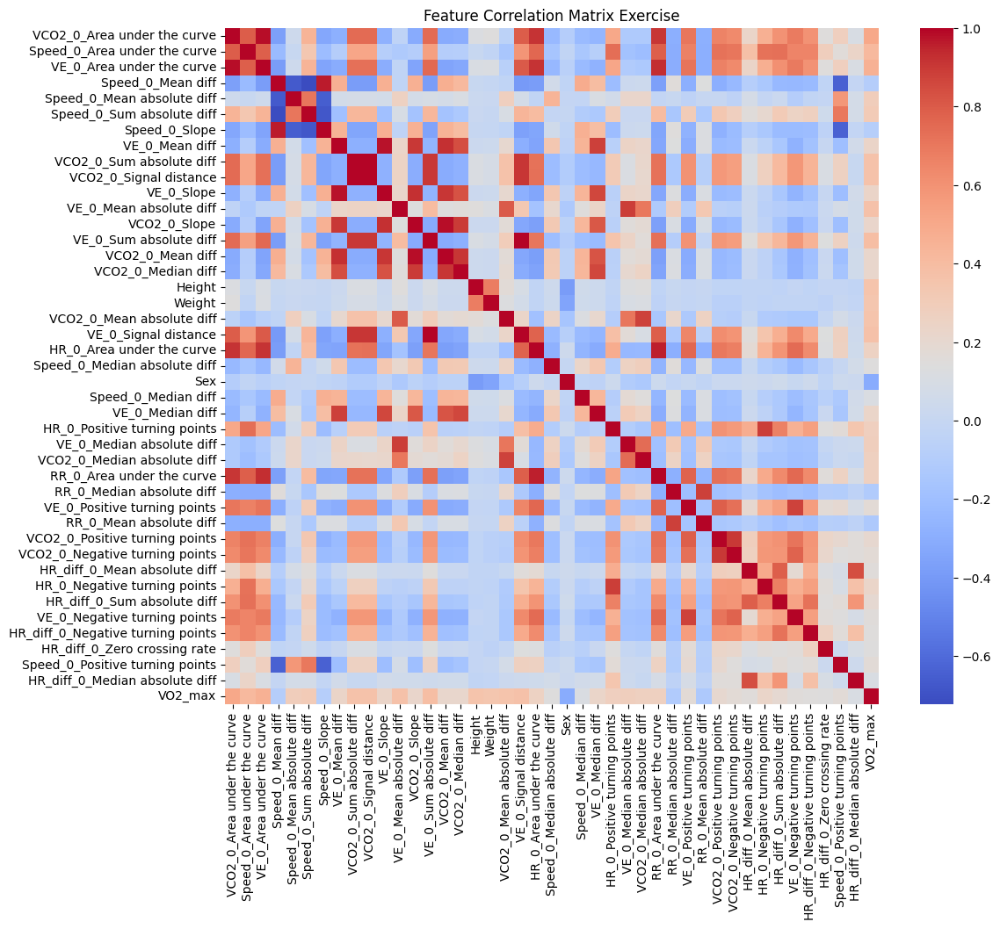

In [150]:
# Compute the correlation matrix for exercise dataset
correlation_matrix = final_exercise_data_tsfel.corr()

# Visualize the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', cbar=True)
plt.title("Feature Correlation Matrix Exercise")
plt.show()

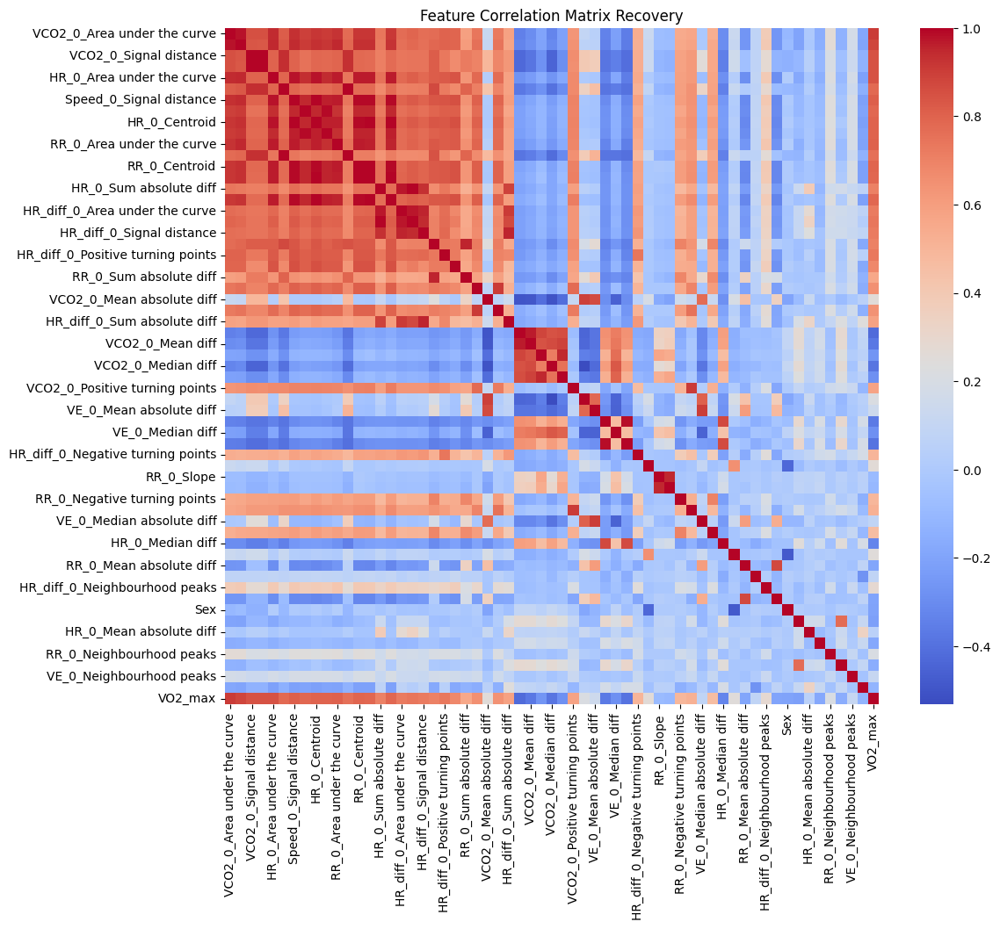

In [151]:
# Compute the correlation matrix for recovery dataset
correlation_matrix_rec = final_recovery_data_tsfel.corr()

# Visualize the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix_rec, annot=False, cmap='coolwarm', cbar=True)
plt.title("Feature Correlation Matrix Recovery")
plt.show()

In [152]:
# drop highly correlated features

# Define the correlation threshold
correlation_threshold = 0.95

# Identify highly correlated features in the exercise dataset
upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
high_corr_features = [column for column in upper_triangle.columns if any(upper_triangle[column] > correlation_threshold)]
print("Highly correlated features to drop (Exercise):", high_corr_features)

# Drop these features from the exercise dataset
final_exercise_data_tsfel = final_exercise_data_tsfel.drop(high_corr_features, axis=1)

# Repeat for the recovery dataset
upper_triangle_rec = correlation_matrix_rec.where(np.triu(np.ones(correlation_matrix_rec.shape), k=1).astype(bool))
high_corr_features_rec = [column for column in upper_triangle_rec.columns if any(upper_triangle_rec[column] > correlation_threshold)]
print("Highly correlated features to drop (Recovery):", high_corr_features_rec)

# Drop these features from the recovery dataset
final_recovery_data_tsfel = final_recovery_data_tsfel.drop(high_corr_features_rec, axis=1)


Highly correlated features to drop (Exercise): ['VE_0_Area under the curve', 'Speed_0_Slope', 'VCO2_0_Signal distance', 'VE_0_Slope', 'VCO2_0_Mean diff', 'VE_0_Signal distance', 'RR_0_Area under the curve']
Highly correlated features to drop (Recovery): ['VE_0_Area under the curve', 'VCO2_0_Sum absolute diff', 'HR_0_Area under the curve', 'Speed_0_Signal distance', 'Speed_0_Area under the curve', 'HR_0_Centroid', 'Speed_0_Centroid', 'RR_0_Area under the curve', 'VE_0_Sum absolute diff', 'RR_0_Centroid', 'VE_0_Centroid', 'VCO2_0_Centroid', 'HR_diff_0_Area under the curve', 'HR_0_Signal distance', 'HR_diff_0_Signal distance', 'RR_0_Sum absolute diff', 'HR_diff_0_Sum absolute diff', 'VCO2_0_Mean diff', 'HR_0_Mean diff']


#### Low variance
Variance measures how much a feature's values vary across the dataset. Features with very low variance have almost constant values and contribute little to prediction and add rather noise. 

In [153]:
# remove features with low variance
from sklearn.feature_selection import VarianceThreshold

# Define a threshold for variance
threshold = 0.01
selector = VarianceThreshold(threshold=threshold)
reduced_data = selector.fit_transform(final_exercise_data_tsfel)

# Keep only the selected features
selected_features = final_exercise_data_tsfel.columns[selector.get_support()]
final_exercise_data_tsfel = final_exercise_data_tsfel[selected_features]
print("Selected features after variance thresholding:", selected_features)


# for recovery set
reduced_data = selector.fit_transform(final_recovery_data_tsfel)
selected_features_rec = final_recovery_data_tsfel.columns[selector.get_support()]
final_recovery_data_tsfel = final_recovery_data_tsfel[selected_features_rec]
print("Selected features after variance thresholding:", selected_features_rec)


Selected features after variance thresholding: Index(['VCO2_0_Area under the curve', 'Speed_0_Area under the curve',
       'Speed_0_Mean diff', 'Speed_0_Mean absolute diff',
       'Speed_0_Sum absolute diff', 'VE_0_Mean diff',
       'VCO2_0_Sum absolute diff', 'VE_0_Mean absolute diff', 'VCO2_0_Slope',
       'VE_0_Sum absolute diff', 'VCO2_0_Median diff', 'Height', 'Weight',
       'VCO2_0_Mean absolute diff', 'HR_0_Area under the curve',
       'Speed_0_Median absolute diff', 'Sex', 'Speed_0_Median diff',
       'VE_0_Median diff', 'HR_0_Positive turning points',
       'VE_0_Median absolute diff', 'VCO2_0_Median absolute diff',
       'RR_0_Median absolute diff', 'VE_0_Positive turning points',
       'RR_0_Mean absolute diff', 'VCO2_0_Positive turning points',
       'VCO2_0_Negative turning points', 'HR_diff_0_Mean absolute diff',
       'HR_0_Negative turning points', 'HR_diff_0_Sum absolute diff',
       'VE_0_Negative turning points', 'HR_diff_0_Negative turning points',
   

#### Feature Importance Using Random Forest

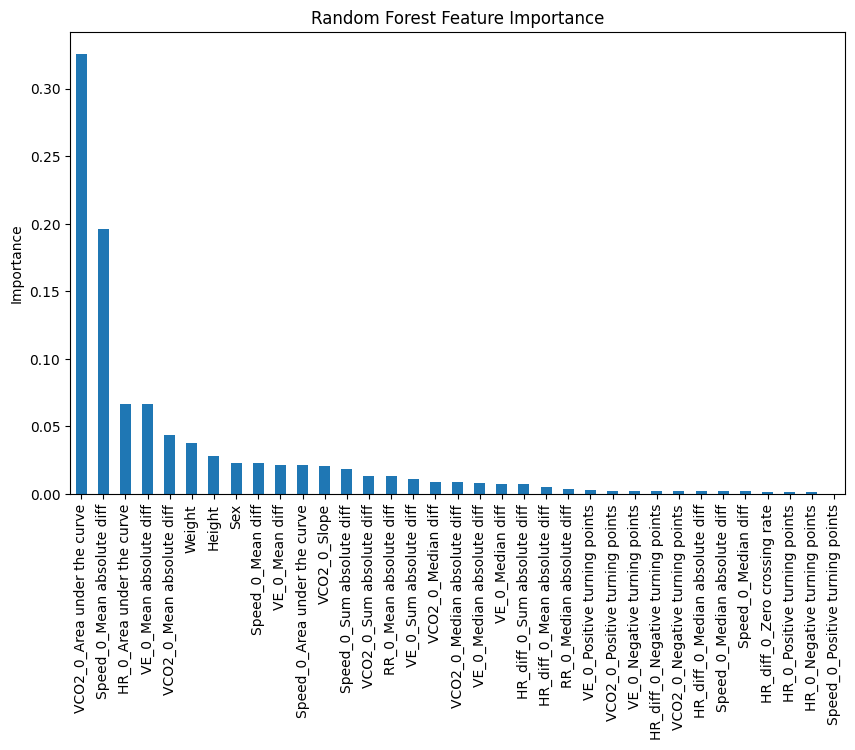

Feature importance scores (Exercise):
VCO2_0_Area under the curve          0.325638
Speed_0_Mean absolute diff           0.196183
HR_0_Area under the curve            0.066782
VE_0_Mean absolute diff              0.066524
VCO2_0_Mean absolute diff            0.043932
Weight                               0.037347
Height                               0.028092
Sex                                  0.022927
Speed_0_Mean diff                    0.022514
VE_0_Mean diff                       0.021312
Speed_0_Area under the curve         0.021177
VCO2_0_Slope                         0.020558
Speed_0_Sum absolute diff            0.018667
VCO2_0_Sum absolute diff             0.013101
RR_0_Mean absolute diff              0.012972
VE_0_Sum absolute diff               0.010720
VCO2_0_Median diff                   0.009071
VCO2_0_Median absolute diff          0.008640
VE_0_Median absolute diff            0.008339
VE_0_Median diff                     0.007483
HR_diff_0_Sum absolute diff          0.006

In [154]:
# Calculate feature importance for the exercise dataset
feature_importance_exercise_tsfel = random_forest_feature_importance(final_exercise_data_tsfel, 'VO2_max')
print("Feature importance scores (Exercise):")
print(feature_importance_exercise_tsfel)

During exercise, features like VCO2 Area Under the Curve (AUC), Speed, and Heart Rate (HR) reflect the immediate metabolic, respiratory, and cardiovascular responses to increasing workload.
For instance, VCO2 AUC represents the accumulated carbon dioxide output, which directly correlates with VO2max as the body's aerobic capacity is stressed.

The first 13 components seem to be the most interesting ones. After the 13th feature the importance doesn't significantally decrease. So it's useful to consider the first 13 for model evaluation in the exercise data.

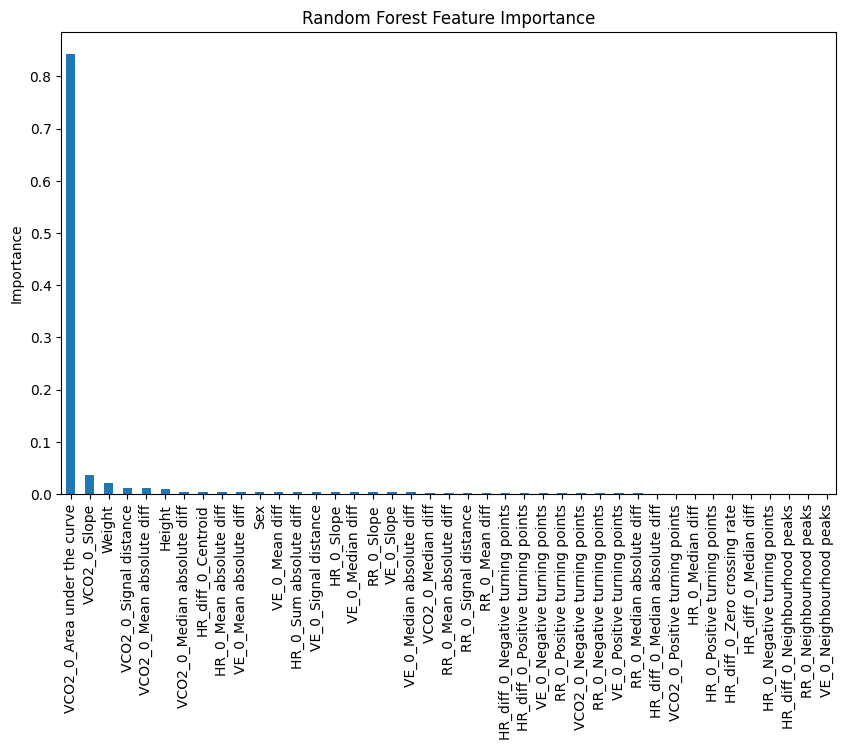

Feature importance scores (Recovery):
VCO2_0_Area under the curve          0.843011
VCO2_0_Slope                         0.036818
Weight                               0.020898
VCO2_0_Signal distance               0.011820
VCO2_0_Mean absolute diff            0.010608
Height                               0.009006
VCO2_0_Median absolute diff          0.004271
HR_diff_0_Centroid                   0.004058
HR_0_Mean absolute diff              0.003922
VE_0_Mean absolute diff              0.003915
Sex                                  0.003637
VE_0_Mean diff                       0.003386
HR_0_Sum absolute diff               0.003350
VE_0_Signal distance                 0.003246
HR_0_Slope                           0.003196
VE_0_Median diff                     0.003177
RR_0_Slope                           0.003004
VE_0_Slope                           0.002776
VE_0_Median absolute diff            0.002752
VCO2_0_Median diff                   0.002625
RR_0_Mean absolute diff              0.002

In [155]:
# Calculate feature importance for the recovery dataset
feature_importance_recovery_tsfel = random_forest_feature_importance(final_recovery_data_tsfel, 'VO2_max')
print("Feature importance scores (Recovery):")
print(feature_importance_recovery_tsfel)

In the recovery phase, the metabolic measure VCO2 heavily dominates because it encapsulates the rate of repayment of oxygen debt and the metabolic recovery process. These dynamics are less prominent during exercise because oxygen consumption and carbon dioxide output are influenced more by workload.

The first 5 components seem to be the most interesting ones. After the 5th feature the importance doesn't significantally decrease. So it's useful to consider the first 5 for model evaluation in the exercise data.

#### Principal Component Analysis (PCA)
PCA transforms the dataset into a smaller number of principal components, which are linear combinations of the original features. It reduces dimensionality while retaining the majority of the variance.

In [156]:
# Apply PCA to the exercise dataset
from sklearn.decomposition import PCA

# Define PCA instance to retain 95% of the variance
pca = PCA(n_components=0.95)

X_exercise = final_exercise_data_tsfel.drop(columns=['VO2_max'])  # Exclude the target column
y_exercise = final_exercise_data_tsfel['VO2_max']
X_exercise_pca = pca.fit_transform(X_exercise)

# Apply PCA to the recovery dataset
X_recovery = final_recovery_data_tsfel.drop(columns=['VO2_max'])  # Exclude the target column
y_recovery = final_recovery_data_tsfel['VO2_max']
X_recovery_pca = pca.fit_transform(X_recovery)

# Print the explained variance ratio to see how much variance is retained
print("Explained Variance Ratio (Exercise):", pca.explained_variance_ratio_)
print("Explained Variance Ratio (Recovery):", pca.explained_variance_ratio_)

# Combine reduced PCA features with the target variable for further analysis
final_exercise_data_pca = pd.DataFrame(X_exercise_pca, columns=[f'PC{i+1}' for i in range(X_exercise_pca.shape[1])])
final_exercise_data_pca['VO2_max'] = y_exercise.reset_index(drop=True)

final_recovery_data_pca = pd.DataFrame(X_recovery_pca, columns=[f'PC{i+1}' for i in range(X_recovery_pca.shape[1])])
final_recovery_data_pca['VO2_max'] = y_recovery.reset_index(drop=True)

print("Final Exercise Dataset with PCA Applied:\n", final_exercise_data_pca.head())
print("Final Recovery Dataset with PCA Applied:\n", final_recovery_data_pca.head())


Explained Variance Ratio (Exercise): [0.26617605 0.16006015 0.08235588 0.05327822 0.05053576 0.03883904
 0.03421346 0.02887298 0.02544663 0.02463744 0.0226356  0.02193656
 0.02070628 0.01918325 0.0156155  0.01493248 0.01466575 0.01259363
 0.00960719 0.00912016 0.00854909 0.00841357 0.00761199 0.00724372]
Explained Variance Ratio (Recovery): [0.26617605 0.16006015 0.08235588 0.05327822 0.05053576 0.03883904
 0.03421346 0.02887298 0.02544663 0.02463744 0.0226356  0.02193656
 0.02070628 0.01918325 0.0156155  0.01493248 0.01466575 0.01259363
 0.00960719 0.00912016 0.00854909 0.00841357 0.00761199 0.00724372]
Final Exercise Dataset with PCA Applied:
         PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -0.632752 -1.576060  0.923801  0.566248  2.808069 -2.711153  0.932567   
1 -0.804338 -2.066220  0.206044  0.506888  1.455546 -3.541447  0.069404   
2 -1.089870 -0.689197  0.494195  0.536890  2.516391 -2.651418 -0.049361   
3 -3.610000  1.184883 -0.048279  0.342469  4.2

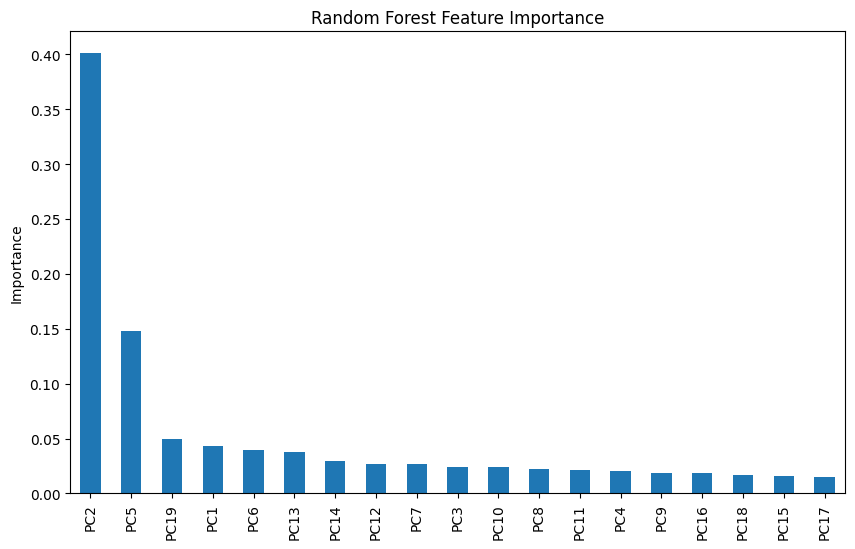

Feature importance scores (Exercise):
PC2     0.400871
PC5     0.147550
PC19    0.049293
PC1     0.043248
PC6     0.039755
PC13    0.037969
PC14    0.029923
PC12    0.027221
PC7     0.027125
PC3     0.024412
PC10    0.023767
PC8     0.021830
PC11    0.021489
PC4     0.020059
PC9     0.018458
PC16    0.018301
PC18    0.017167
PC15    0.016265
PC17    0.015297
dtype: float64


In [157]:
# Calculate feature importance for the exercise dataset
feature_importance_exercise_pca = random_forest_feature_importance(final_exercise_data_pca, 'VO2_max')
print("Feature importance scores (Exercise):")
print(feature_importance_exercise_pca)

The first 10 components seem to be the most interesting ones. After the 10th feature the importance doesn't significantally decrease. So it's useful to consider the first 10 for model evaluation in the exercise data.

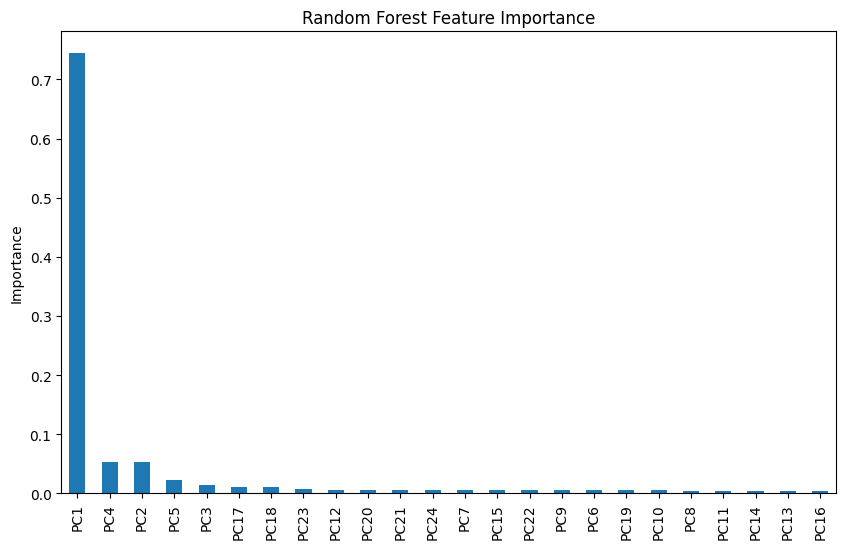

Feature importance scores (Exercise):
PC1     0.743955
PC4     0.053876
PC2     0.053474
PC5     0.023420
PC3     0.013722
PC17    0.010573
PC18    0.010324
PC23    0.006985
PC12    0.006333
PC20    0.006243
PC21    0.006103
PC24    0.006102
PC7     0.006078
PC15    0.005937
PC22    0.005407
PC9     0.005354
PC6     0.005170
PC19    0.005126
PC10    0.005094
PC8     0.004852
PC11    0.004065
PC14    0.003967
PC13    0.003938
PC16    0.003901
dtype: float64


In [158]:
# Calculate feature importance for the recovery dataset
feature_importance_recovery_pca = random_forest_feature_importance(final_recovery_data_pca, 'VO2_max')
print("Feature importance scores (Exercise):")
print(feature_importance_recovery_pca)

The first 7 components seem to be the most interesting ones. After the 7th feature the importance doesn't significantally decrease. So it's useful to consider the first 7 for model evaluation in the recovery data.

## Model Fitting with TSFEL 

### Grid Search vs. Random Search

Grid Search exhaustively evaluates every possible combination of hyperparameters within a predefined grid, which can be very computationally expensive, especially for high-dimensional spaces.

Random Search samples a fixed number of random combinations of hyperparameters, which can often find good solutions more quickly because it doesn't explore every single combination.

For TSFEL, random search is often better because the hyperparameter space can be very large (e.g., different feature extraction configurations, window sizes, etc.), and random search can explore this space more efficiently without being limited by the exhaustiveness of grid search.
The same case applies here. The computational efficiency was too high to solve the model fitting with Grid Search, why now only Random Search is used.

#### with PCA reduced data

##### Exercise

In [159]:
# with recursive feature selection
exercise_rfs_tsfel_df = model_evaluation_with_random_search(final_exercise_data_pca, target_column='VO2_max', 
                                    feature_selection_function=rfe_feature_selection, 
                                    num_features=10)
exercise_rfs_tsfel_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 300, 'model__min_samples_split': 5, 'model__max_depth': 30}
Final MSE for Random Forest: 0.06323172638653414

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 300, 'model__max_depth': 3, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.24848878973042485

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'auto', 'model__C': 1}
Final MSE for SVR: 0.25541725385791103

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.4176895409658053


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 300, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 300, 'model__max_depth...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'auto...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.356343   1.317018   0.000004   
XGBoost                             0.339089   2.383363   0.000035   
SVR                                 0.

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 300, 'model__min_sampl...",0.356343,1.317018,0.000004,0.189146,0.165698,0.063232,0.189146,0.936768
XGBoost,"{'model__n_estimators': 300, 'model__max_depth...",0.339089,2.383363,0.000035,0.385824,0.315640,0.248489,0.385824,0.751511
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'auto...",0.328162,2.695803,0.000136,0.372967,0.341047,0.255417,0.372967,0.744583
Linear Regression,None,NaN,3.315819,0.000011,0.509201,0.398000,0.417690,0.509201,0.582310


In [160]:
# with greedy_forward_backward_selection2 function
exercise_fbs_tsfel_df = model_evaluation_with_random_search(final_exercise_data_pca, target_column='VO2_max', 
                                  feature_selection_function=forward_backward_feature_selection, 
                                  num_features=10, cv=5)
exercise_fbs_tsfel_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 300, 'model__min_samples_split': 5, 'model__max_depth': 30}
Final MSE for Random Forest: 0.06453496391748711

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 300, 'model__max_depth': 3, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.25387853222238016

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'scale', 'model__C': 1}
Final MSE for SVR: 0.26563325207970534

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.4185639157768983


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 300, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 300, 'model__max_depth...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'scal...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.360361   1.301233   0.000025   
XGBoost                             0.344838   2.416003   0.000054   
SVR                                 0

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 300, 'model__min_sampl...",0.360361,1.301233,0.000025,0.191515,0.166904,0.064535,0.191515,0.935465
XGBoost,"{'model__n_estimators': 300, 'model__max_depth...",0.344838,2.416003,0.000054,0.391394,0.317316,0.253879,0.391394,0.746121
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'scal...",0.333695,2.725145,0.000119,0.384263,0.343475,0.265633,0.384263,0.734367
Linear Regression,None,NaN,3.315274,0.000126,0.509247,0.399038,0.418564,0.509247,0.581436


In [161]:
# with random forest feature selection
exercise_rff_tsfel_df = model_evaluation_with_random_search(final_exercise_data_pca, target_column='VO2_max',
                                  feature_selection_function=random_forest_feature_selection, 
                                  num_features=10, cv=5)
exercise_rff_tsfel_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 300, 'model__min_samples_split': 2, 'model__max_depth': 30}
Final MSE for Random Forest: 0.04847031916582783

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 300, 'model__max_depth': 3, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.252719224204209

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'scale', 'model__C': 1}
Final MSE for SVR: 0.2593557896095263

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.4185247955180362


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 300, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 300, 'model__max_depth...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'scal...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.358697   1.021008   0.000080   
XGBoost                             0.345143   2.424196   0.000260   
SVR                                 0.

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 300, 'model__min_sampl...",0.358697,1.021008,0.000080,0.169156,0.140913,0.048470,0.169156,0.951530
XGBoost,"{'model__n_estimators': 300, 'model__max_depth...",0.345143,2.424196,0.000260,0.390157,0.317012,0.252719,0.390157,0.747281
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'scal...",0.331312,2.763253,0.000076,0.377227,0.342134,0.259356,0.377227,0.740644
Linear Regression,None,NaN,3.299622,0.000078,0.509247,0.398989,0.418525,0.509247,0.581475


##### Recovery 

In [162]:
# with recursive feature selection
recovery_rfs_tsfel_df = model_evaluation_with_random_search(final_recovery_data_pca, target_column='VO2_max', 
                                    feature_selection_function=rfe_feature_selection, 
                                    num_features=7)
recovery_rfs_tsfel_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 200, 'model__min_samples_split': 2, 'model__max_depth': 20}
Final MSE for Random Forest: 0.02067535849916571

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 100, 'model__max_depth': 3, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.07481577369276671

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'scale', 'model__C': 1}
Final MSE for SVR: 0.10916223706868333

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.19626006909005786


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 200, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 100, 'model__max_depth...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'scal...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.152826   0.720027   0.000013   
XGBoost                             0.155370   1.253378   0.000682   
SVR                                 

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 200, 'model__min_sampl...",0.152826,0.720027,0.000013,0.105631,0.097557,0.020675,0.105631,0.979325
XGBoost,"{'model__n_estimators': 100, 'model__max_depth...",0.155370,1.253378,0.000682,0.204675,0.181450,0.074816,0.204675,0.925184
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'scal...",0.162138,1.802932,0.000231,0.236999,0.230203,0.109162,0.236999,0.890838
Linear Regression,None,NaN,2.044790,0.000056,0.340144,0.283835,0.196260,0.340144,0.803740


In [163]:
# with greedy_forward_backward_selection2 function
recovery_fbs_tsfel_df = model_evaluation_with_random_search(final_recovery_data_pca, target_column='VO2_max', 
                                  feature_selection_function=forward_backward_feature_selection, 
                                  num_features=7, cv=5)
recovery_fbs_tsfel_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 300, 'model__min_samples_split': 5, 'model__max_depth': 10}
Final MSE for Random Forest: 0.0490447965213104

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 50, 'model__max_depth': 3, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.1153977090012473

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'auto', 'model__C': 1}
Final MSE for SVR: 0.12462942820496514

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.23902480381231406


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 300, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 50, 'model__max_depth'...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'auto...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.172376   1.151344   0.000288   
XGBoost                             0.177399   1.945761   0.000479   
SVR                                 0

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 300, 'model__min_sampl...",0.172376,1.151344,0.000288,0.167763,0.144570,0.049045,0.167763,0.950955
XGBoost,"{'model__n_estimators': 50, 'model__max_depth'...",0.177399,1.945761,0.000479,0.254126,0.225427,0.115398,0.254126,0.884602
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'auto...",0.185264,1.854824,0.000776,0.252511,0.246714,0.124629,0.252511,0.875371
Linear Regression,None,NaN,2.024124,0.000810,0.374906,0.313800,0.239025,0.374906,0.760975


In [164]:
# with random forest feature selection
recovery_rff_tsfel_df = model_evaluation_with_random_search(final_recovery_data_pca, target_column='VO2_max',
                                  feature_selection_function=random_forest_feature_selection, 
                                  num_features=7, cv=5)
recovery_rff_tsfel_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 200, 'model__min_samples_split': 2, 'model__max_depth': 20}
Final MSE for Random Forest: 0.020720717123015868

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 100, 'model__max_depth': 3, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.07481577369276671

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'scale', 'model__C': 1}
Final MSE for SVR: 0.10916223706868332

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.19626006909005783


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 200, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 100, 'model__max_depth...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'scal...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.152587   0.745003   0.000016   
XGBoost                             0.155225   1.253378   0.000682   
SVR                                 

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 200, 'model__min_sampl...",0.152587,0.745003,0.000016,0.105873,0.097527,0.020721,0.105873,0.979279
XGBoost,"{'model__n_estimators': 100, 'model__max_depth...",0.155225,1.253378,0.000682,0.204675,0.181450,0.074816,0.204675,0.925184
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'scal...",0.162138,1.802932,0.000231,0.236999,0.230203,0.109162,0.236999,0.890838
Linear Regression,None,NaN,2.044790,0.000056,0.340144,0.283835,0.196260,0.340144,0.803740


### without PCA

### without PCA

In [165]:
# with recursive feature selection
exercise_rfs_tsfel_norm_df = model_evaluation_with_random_search(final_exercise_data_tsfel, target_column='VO2_max', 
                                    feature_selection_function=rfe_feature_selection, 
                                    num_features=13)
exercise_rfs_tsfel_norm_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 300, 'model__min_samples_split': 2, 'model__max_depth': 30}
Final MSE for Random Forest: 0.020297097702598143

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 300, 'model__max_depth': 6, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.020124188839065863

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'auto', 'model__C': 10}
Final MSE for SVR: 0.08401547059717326

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.3033172850405688


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 300, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 300, 'model__max_depth...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'auto...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error     Min Error  \
Model                                                                   
Random Forest                       0.154285   0.891922  1.665335e-15   
XGBoost                             0.118978   0.796235  1.639012e-05   
SVR                      

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 300, 'model__min_sampl...",0.154285,0.891922,1.665335e-15,0.105801,0.095411,0.020297,0.105801,0.979703
XGBoost,"{'model__n_estimators': 300, 'model__max_depth...",0.118978,0.796235,1.639012e-05,0.107584,0.092466,0.020124,0.107584,0.979876
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'auto...",0.137884,2.047676,2.088784e-05,0.207001,0.202895,0.084015,0.207001,0.915985
Linear Regression,None,NaN,2.883378,4.197695e-05,0.422768,0.352965,0.303317,0.422768,0.696683


In [166]:
# with greedy_forward_backward_selection2 function
exercise_fbs_tsfel_norm_df = model_evaluation_with_random_search(final_exercise_data_tsfel, target_column='VO2_max', 
                                  feature_selection_function=forward_backward_feature_selection, 
                                  num_features=13, cv=5)

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 300, 'model__min_samples_split': 2, 'model__max_depth': 20}
Final MSE for Random Forest: 0.019104705454917586

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 200, 'model__max_depth': 3, 'model__learning_rate': 0.2}
Final MSE for XGBoost: 0.08040081409284898

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'auto', 'model__C': 10}
Final MSE for SVR: 0.07484115175814714

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.3145891353827464


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 300, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 200, 'model__max_depth...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'auto...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.143618   0.756475   0.000006   
XGBoost                             0.122404   1.191778   0.000019   
SVR                                 0

In [167]:
# with random forest feature selection
exercise_rff_tsfel_norm_df = model_evaluation_with_random_search(final_exercise_data_tsfel, target_column='VO2_max',
                                  feature_selection_function=random_forest_feature_selection, 
                                  num_features=13, cv=5)
exercise_rff_tsfel_norm_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 300, 'model__min_samples_split': 2, 'model__max_depth': 30}
Final MSE for Random Forest: 0.020331120367608577

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 300, 'model__max_depth': 6, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.020124188839065863

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'auto', 'model__C': 10}
Final MSE for SVR: 0.08401547059717054

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.3033172850405688


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 300, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 300, 'model__max_depth...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'auto...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.154091   0.871138   0.000012   
XGBoost                             0.119000   0.796235   0.000016   
SVR                                 0

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 300, 'model__min_sampl...",0.154091,0.871138,0.000012,0.105723,0.095675,0.020331,0.105723,0.979669
XGBoost,"{'model__n_estimators': 300, 'model__max_depth...",0.119000,0.796235,0.000016,0.107584,0.092466,0.020124,0.107584,0.979876
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'auto...",0.137884,2.047676,0.000021,0.207001,0.202895,0.084015,0.207001,0.915985
Linear Regression,None,NaN,2.883378,0.000042,0.422768,0.352965,0.303317,0.422768,0.696683


##### Recovery

In [168]:
# with recursive feature selection
recovery_rfs_tsfel_norm_df = model_evaluation_with_random_search(final_recovery_data_tsfel, target_column='VO2_max', 
                                    feature_selection_function=rfe_feature_selection, 
                                    num_features=5)
recovery_rfs_tsfel_norm_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 100, 'model__min_samples_split': 10, 'model__max_depth': 20}
Final MSE for Random Forest: 0.03217926378505734

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 100, 'model__max_depth': 3, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.04976330962909919

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'scale', 'model__C': 10}
Final MSE for SVR: 0.06128264048580842

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.13300188960354792


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 100, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 100, 'model__max_depth...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'scal...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.101027   0.908134   0.000038   
XGBoost                             0.098197   1.029694   0.000197   
SVR                                

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 100, 'model__min_sampl...",0.101027,0.908134,0.000038,0.133636,0.119669,0.032179,0.133636,0.967821
XGBoost,"{'model__n_estimators': 100, 'model__max_depth...",0.098197,1.029694,0.000197,0.170261,0.144133,0.049763,0.170261,0.950237
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'scal...",0.108464,1.220851,0.000193,0.181398,0.168456,0.061283,0.181398,0.938717
Linear Regression,None,NaN,1.577894,0.000791,0.267098,0.248316,0.133002,0.267098,0.866998


In [169]:
# with greedy_forward_backward_selection2 function
recovery_fbs_tsfel_norm_df = model_evaluation_with_random_search(final_recovery_data_tsfel, target_column='VO2_max', 
                                  feature_selection_function=forward_backward_feature_selection, 
                                  num_features=5, cv=5)
recovery_fbs_tsfel_norm_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 100, 'model__min_samples_split': 10, 'model__max_depth': 30}
Final MSE for Random Forest: 0.03438171442534768

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 50, 'model__max_depth': 3, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.06493548813392622

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'scale', 'model__C': 1}
Final MSE for SVR: 0.08607800302891183

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.1331072025908516


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 100, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 50, 'model__max_depth'...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'scal...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.105173   0.900424   0.000072   
XGBoost                             0.098938   1.107174   0.000282   
SVR                                 0

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 100, 'model__min_sampl...",0.105173,0.900424,0.000072,0.139731,0.121890,0.034382,0.139731,0.965618
XGBoost,"{'model__n_estimators': 50, 'model__max_depth'...",0.098938,1.107174,0.000282,0.194705,0.164395,0.064935,0.194705,0.935065
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'scal...",0.108642,1.422664,0.000274,0.216906,0.197560,0.086078,0.216906,0.913922
Linear Regression,None,NaN,1.585601,0.000177,0.267581,0.248008,0.133107,0.267581,0.866893


In [170]:
# with random forest feature selection
recovery_rff_tsfel_norm_df = model_evaluation_with_random_search(final_recovery_data_tsfel, target_column='VO2_max',
                                  feature_selection_function=random_forest_feature_selection, 
                                  num_features=5, cv=5)
recovery_rff_tsfel_norm_df

Evaluating Random Forest...
Best Hyperparameters for Random Forest: {'model__n_estimators': 100, 'model__min_samples_split': 10, 'model__max_depth': 20}
Final MSE for Random Forest: 0.03225864618898589

Evaluating XGBoost...
Best Hyperparameters for XGBoost: {'model__n_estimators': 100, 'model__max_depth': 3, 'model__learning_rate': 0.1}
Final MSE for XGBoost: 0.04976330962909919

Evaluating SVR...


/opt/anaconda3/envs/aaeb/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Hyperparameters for SVR: {'model__kernel': 'rbf', 'model__gamma': 'auto', 'model__C': 10}
Final MSE for SVR: 0.06128264048580744

Evaluating Linear Regression...
Final MSE for Linear Regression: 0.13300188960354792


Evaluation Metrics Summary:
                                                 Best Hyperparameters  \
Model                                                                  
Random Forest      {'model__n_estimators': 100, 'model__min_sampl...   
XGBoost            {'model__n_estimators': 100, 'model__max_depth...   
SVR                {'model__kernel': 'rbf', 'model__gamma': 'auto...   
Linear Regression                                               None   

                   Best Cross-validation MSE  Max Error  Min Error  \
Model                                                                
Random Forest                       0.101060   0.908134   0.000038   
XGBoost                             0.098123   1.029694   0.000197   
SVR                                 

,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2
Model,,,,,,,,,
Random Forest,"{'model__n_estimators': 100, 'model__min_sampl...",0.101060,0.908134,0.000038,0.133816,0.119799,0.032259,0.133816,0.967741
XGBoost,"{'model__n_estimators': 100, 'model__max_depth...",0.098123,1.029694,0.000197,0.170261,0.144133,0.049763,0.170261,0.950237
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'auto...",0.108464,1.220851,0.000193,0.181398,0.168456,0.061283,0.181398,0.938717
Linear Regression,None,NaN,1.577894,0.000791,0.267098,0.248316,0.133002,0.267098,0.866998


## Final Result and Comparison of all models

### Model Evaluation without TSFEL

#### Exercise

In [215]:
# DataFrames from different methods
df_exercise = [exercise_rfs_grid_df, exercise_fbs_grid_df, exercise_rff_grid_df,
               exercise_rfs_random_df, exercise_fbs_random_df, exercise_rff_random_df]

# Add a new column 'Method' to each DataFrame indicating the corresponding method
methods = ["RFE + Grid Search", "Forward + Backward + Grid Search", "Random Tree + Grid Search",
           "RFE + Random Search", "Forward + Backward + Random Search", "Random Tree + Random Search"]
for i, df in enumerate(df_exercise):
    df["Method"] = methods[i]

# Concatenate all DataFrames into one combined DataFrame
df_exercise_result = pd.concat(df_exercise)

# Select the best model based on a metric (e.g., highest R2 and lowest MSE)
# First, sort by 'R2' in descending order and then by 'MSE' in ascending order
best_model_exercise = df_exercise_result.sort_values(by=['R2', 'MSE'], ascending=[False, True])

# Print the best model (the first row after sorting)
print("Best model:")
best_model_exercise


Best model:


,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2,Method,Best Hyperparameters,Best Cross-validation MSE
Model,,,,,,,,,,
Random Forest,1.181527,0.000451,0.274275,0.212078,0.120204,0.274275,0.879796,RFE + Random Search,"{'model__n_estimators': 300, 'model__min_sampl...",0.445203
Random Forest,1.366061,0.000590,0.286944,0.226199,0.133503,0.286944,0.866497,Random Tree + Random Search,"{'model__n_estimators': 300, 'model__min_sampl...",0.445691
Random Forest,1.368363,0.000210,0.290877,0.231308,0.138113,0.290877,0.861887,RFE + Grid Search,NaN,NaN
Random Forest,1.368363,0.000189,0.291349,0.231617,0.138531,0.291349,0.861469,Random Tree + Grid Search,NaN,NaN
Random Forest,1.386570,0.000737,0.295695,0.233449,0.141934,0.295695,0.858066,Forward + Backward + Random Search,"{'model__n_estimators': 300, 'model__min_sampl...",0.458282
Random Forest,1.620088,0.000422,0.332062,0.261445,0.178619,0.332062,0.821381,Forward + Backward + Grid Search,NaN,NaN
XGBoost,1.880819,0.000461,0.384298,0.305947,0.241289,0.384298,0.758711,RFE + Grid Search,NaN,NaN
XGBoost,1.880819,0.000461,0.384298,0.305947,0.241289,0.384298,0.758711,Random Tree + Grid Search,NaN,NaN
XGBoost,2.291974,0.000596,0.397252,0.325547,0.263790,0.397252,0.736210,Forward + Backward + Grid Search,NaN,NaN


#### Recovery

In [216]:
# DataFrames from different methods 
df_recovery = [recovery_rfs_grid_df, recovery_fbs_grid_df, recovery_rff_grid_df,
               recovery_rfs_random_df, recovery_fbs_random_df, recovery_rff_random_df]

# Add a new column 'Method' to each DataFrame indicating the corresponding method
methods = ["RFE + Grid Search", "Forward + Backward + Grid Search", "Random Tree + Grid Search",
           "RFE + Random Search", "Forward + Backward + Random Search", "Random Tree + Random Search"]
for i, df in enumerate(df_recovery):
    df["Method"] = methods[i]

# Concatenate all DataFrames into one combined DataFrame
df_recovery_result = pd.concat(df_recovery)

# Select the best model based on a metric (e.g., highest R2 and lowest MSE)
# First, sort by 'R2' in descending order and then by 'MSE' in ascending order
best_model_recovery = df_recovery_result.sort_values(by=['R2', 'MSE'], ascending=[False, True])

# Print the best model (the first row after sorting)
print("Best model:")
best_model_recovery

Best model:


,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2,Method,Best Hyperparameters,Best Cross-validation MSE
Model,,,,,,,,,,
Random Forest,1.411290,0.001589,0.309818,0.252172,0.159578,0.309818,0.840422,Random Tree + Random Search,"{'model__n_estimators': 100, 'model__min_sampl...",0.501277
Random Forest,1.554601,0.002166,0.314070,0.254222,0.163269,0.314070,0.836731,RFE + Random Search,"{'model__n_estimators': 100, 'model__min_sampl...",0.498930
Random Forest,1.437727,0.001669,0.322734,0.252606,0.167967,0.322734,0.832033,RFE + Grid Search,NaN,NaN
Random Forest,1.280301,0.000954,0.327233,0.260176,0.174773,0.327233,0.825227,Forward + Backward + Random Search,"{'model__n_estimators': 100, 'model__min_sampl...",0.492443
Random Forest,1.428141,0.001248,0.335854,0.264989,0.183017,0.335854,0.816983,Random Tree + Grid Search,NaN,NaN
Random Forest,1.318188,0.000289,0.352700,0.272429,0.198615,0.352700,0.801385,Forward + Backward + Grid Search,NaN,NaN
XGBoost,1.412935,0.000786,0.344257,0.285839,0.200217,0.344257,0.799783,RFE + Grid Search,NaN,NaN
XGBoost,1.496270,0.006997,0.355962,0.297827,0.215410,0.355962,0.784590,RFE + Random Search,"{'model__n_estimators': 50, 'model__max_depth'...",0.468808
XGBoost,1.643413,0.001238,0.362962,0.302184,0.223057,0.362962,0.776943,Random Tree + Grid Search,NaN,NaN


### Model Evaluation with TSFEL

#### Exercise

In [217]:
# DataFrames from different methods 
df_exercise_tsfel = [exercise_rfs_tsfel_df, exercise_fbs_tsfel_df, exercise_rff_tsfel_df,
               exercise_rfs_tsfel_norm_df, exercise_fbs_tsfel_norm_df, exercise_rff_tsfel_norm_df]

# Add a new column 'Method' to each DataFrame indicating the corresponding method
methods = ["RFE + PCA", "Forward + Backward +PCA", "Random Tree + PCA",
           "RFE", "Forward + Backward ", "Random Tree "]
for i, df in enumerate(df_exercise_tsfel):
    df["Method"] = methods[i]

# Concatenate all DataFrames into one combined DataFrame
df_exercise_tsfel_result = pd.concat(df_exercise_tsfel)

# Select the best model based on a metric (e.g., highest R2 and lowest MSE)
# First, sort by 'R2' in descending order and then by 'MSE' in ascending order
best_model_exercise_tsfel = df_exercise_tsfel_result.sort_values(by=['R2', 'MSE'], ascending=[False, True])

# Print the best model (the first row after sorting)
print("Best model:")
best_model_exercise_tsfel

Best model:


,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2,Method
Model,,,,,,,,,,
Random Forest,"{'model__n_estimators': 300, 'model__min_sampl...",0.143618,0.756475,5.557911e-06,0.104202,0.090811,0.019105,0.104202,0.980895,Forward + Backward
XGBoost,"{'model__n_estimators': 300, 'model__max_depth...",0.118978,0.796235,1.639012e-05,0.107584,0.092466,0.020124,0.107584,0.979876,RFE
XGBoost,"{'model__n_estimators': 300, 'model__max_depth...",0.119000,0.796235,1.639012e-05,0.107584,0.092466,0.020124,0.107584,0.979876,Random Tree
Random Forest,"{'model__n_estimators': 300, 'model__min_sampl...",0.154285,0.891922,1.665335e-15,0.105801,0.095411,0.020297,0.105801,0.979703,RFE
Random Forest,"{'model__n_estimators': 300, 'model__min_sampl...",0.154091,0.871138,1.202970e-05,0.105723,0.095675,0.020331,0.105723,0.979669,Random Tree
Random Forest,"{'model__n_estimators': 300, 'model__min_sampl...",0.358697,1.021008,8.019797e-05,0.169156,0.140913,0.048470,0.169156,0.951530,Random Tree + PCA
Random Forest,"{'model__n_estimators': 300, 'model__min_sampl...",0.356343,1.317018,3.688326e-06,0.189146,0.165698,0.063232,0.189146,0.936768,RFE + PCA
Random Forest,"{'model__n_estimators': 300, 'model__min_sampl...",0.360361,1.301233,2.457249e-05,0.191515,0.166904,0.064535,0.191515,0.935465,Forward + Backward +PCA
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'auto...",0.113971,1.557566,1.892061e-05,0.201186,0.185379,0.074841,0.201186,0.925159,Forward + Backward


#### Recovery

In [218]:
# DataFrames from different methods 
df_recovery_tsfel = [recovery_rfs_tsfel_df, recovery_fbs_tsfel_df, recovery_rff_tsfel_df,
               recovery_rfs_tsfel_norm_df, recovery_fbs_tsfel_norm_df, recovery_rff_tsfel_norm_df]

# Add a new column 'Method' to each DataFrame indicating the corresponding method
methods = ["RFE + PCA", "Forward + Backward +PCA", "Random Tree + PCA",
           "RFE", "Forward + Backward ", "Random Tree "]
for i, df in enumerate(df_recovery_tsfel):
    df["Method"] = methods[i]

# Concatenate all DataFrames into one combined DataFrame
df_recovery_tsfel_result = pd.concat(df_recovery_tsfel)

# Select the best model based on a metric (e.g., highest R2 and lowest MSE)
# First, sort by 'R2' in descending order and then by 'MSE' in ascending order
best_model_recovery_tsfel = df_recovery_tsfel_result.sort_values(by=['R2', 'MSE'], ascending=[False, True])

# Print the best model (the first row after sorting)
print("Best model:")
best_model_recovery_tsfel

Best model:


,Best Hyperparameters,Best Cross-validation MSE,Max Error,Min Error,Mean Error,Std Deviation,MSE,MAE,R2,Method
Model,,,,,,,,,,
Random Forest,"{'model__n_estimators': 200, 'model__min_sampl...",0.152826,0.720027,0.000013,0.105631,0.097557,0.020675,0.105631,0.979325,RFE + PCA
Random Forest,"{'model__n_estimators': 200, 'model__min_sampl...",0.152587,0.745003,0.000016,0.105873,0.097527,0.020721,0.105873,0.979279,Random Tree + PCA
Random Forest,"{'model__n_estimators': 100, 'model__min_sampl...",0.101027,0.908134,0.000038,0.133636,0.119669,0.032179,0.133636,0.967821,RFE
Random Forest,"{'model__n_estimators': 100, 'model__min_sampl...",0.101060,0.908134,0.000038,0.133816,0.119799,0.032259,0.133816,0.967741,Random Tree
Random Forest,"{'model__n_estimators': 100, 'model__min_sampl...",0.105173,0.900424,0.000072,0.139731,0.121890,0.034382,0.139731,0.965618,Forward + Backward
Random Forest,"{'model__n_estimators': 300, 'model__min_sampl...",0.172376,1.151344,0.000288,0.167763,0.144570,0.049045,0.167763,0.950955,Forward + Backward +PCA
XGBoost,"{'model__n_estimators': 100, 'model__max_depth...",0.098197,1.029694,0.000197,0.170261,0.144133,0.049763,0.170261,0.950237,RFE
XGBoost,"{'model__n_estimators': 100, 'model__max_depth...",0.098123,1.029694,0.000197,0.170261,0.144133,0.049763,0.170261,0.950237,Random Tree
SVR,"{'model__kernel': 'rbf', 'model__gamma': 'auto...",0.108464,1.220851,0.000193,0.181398,0.168456,0.061283,0.181398,0.938717,Random Tree
